## Initial Enviorment testing
(used different workstation for the project)
In 2022 (TensorFlow 2.11), TensorFlow stopped providing native Windows GPU (CUDA) builds.
The tensorflow version used in this project is tensorflow 2.21.0.

## Dataset download for Google Colab

In [1]:
from google.colab import files

files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"ergqeg","key":"ec85ff183f74c9353325c095bfc35514"}'}

In [2]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [3]:
!pip install -q kaggle

!kaggle competitions download -c cassava-leaf-disease-classification -p /content/cassava

100% 5.76G/5.76G [00:26<00:00, 231MB/s]



In [4]:
import zipfile
from pathlib import Path

data_dir = Path("/content/cassava")

for zip_file in data_dir.glob("*.zip"):
    print("Unzipping:", zip_file)
    with zipfile.ZipFile(zip_file, "r") as z:
        z.extractall(data_dir)

print("Done")

Unzipping: /content/cassava/cassava-leaf-disease-classification.zip
Done


## Code start

In [5]:
import tensorflow as tf
print(tf.__version__)

2.20.0


In [6]:
# Check for GPU
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 2481810061465709642
xla_global_id: -1
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 14426112000
locality {
  bus_id: 1
  links {
  }
}
incarnation: 1778340460007870817
physical_device_desc: "device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5"
xla_global_id: 416903419
]


In [7]:
# Check for GPU
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 3597850359593268280
xla_global_id: -1
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 14426112000
locality {
  bus_id: 1
  links {
  }
}
incarnation: 14633862594198967052
physical_device_desc: "device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5"
xla_global_id: 416903419
]


In [8]:
!nvidia-smi

Sat May  9 11:41:13 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   44C    P0             26W /   70W |     105MiB /  15360MiB |      4%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

## Data Inspection

In [9]:
!pip install keras-tuner

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.4/129.4 kB 3.8 MB/s eta 0:00:00


In [10]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.model_selection import train_test_split
import tensorflow as tf
import seaborn as sns
import random

from sklearn.utils.class_weight import compute_class_weight
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix

from keras_tuner.tuners import RandomSearch
# SID 2191871 took last three digits for random state
random_seed = 871;
tf.random.set_seed(random_seed)
np.random.seed(random_seed)
random.seed(random_seed)

In [11]:
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import label_binarize

In [12]:
df = pd.read_csv("/content/cassava/train.csv")
print(df.head())

image_dir = "/content/cassava/train_images"

df["file_path"] = df["image_id"].apply(lambda x: os.path.join(image_dir, x))

print(df.head())

         image_id  label
0  1000015157.jpg      0
1  1000201771.jpg      3
2   100042118.jpg      1
3  1000723321.jpg      1
4  1000812911.jpg      3
         image_id  label                                     file_path
0  1000015157.jpg      0  /content/cassava/train_images/1000015157.jpg
1  1000201771.jpg      3  /content/cassava/train_images/1000201771.jpg
2   100042118.jpg      1   /content/cassava/train_images/100042118.jpg
3  1000723321.jpg      1  /content/cassava/train_images/1000723321.jpg
4  1000812911.jpg      3  /content/cassava/train_images/1000812911.jpg


- #### "0": Cassava Bacterial Blight (CBB),
- #### "1": Cassava Brown Streak Disease (CBSD),
- #### "2": Cassava Green Mottle (CGM),
- #### "3": Cassava Mosaic Disease (CMD),
- #### "4": Healthy

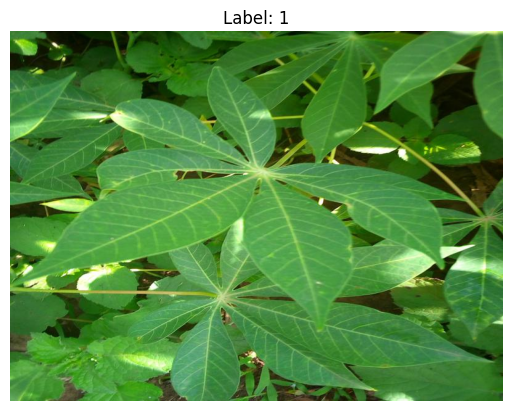

In [13]:
idx = 2  # picture index

row = df.iloc[idx]
img = Image.open(row["file_path"])

plt.imshow(img)
plt.title(f"Label: {row['label']}")
plt.axis("off")
plt.show()

In [14]:
print(df.shape)

(21397, 3)


In [15]:
df.head()

,image_id,label,file_path
0,1000015157.jpg,0,/content/cassava/train_images/1000015157.jpg
1,1000201771.jpg,3,/content/cassava/train_images/1000201771.jpg
2,100042118.jpg,1,/content/cassava/train_images/100042118.jpg
3,1000723321.jpg,1,/content/cassava/train_images/1000723321.jpg
4,1000812911.jpg,3,/content/cassava/train_images/1000812911.jpg


In [16]:
df.info

<bound method DataFrame.info of              image_id  label                                     file_path
0      1000015157.jpg      0  /content/cassava/train_images/1000015157.jpg
1      1000201771.jpg      3  /content/cassava/train_images/1000201771.jpg
2       100042118.jpg      1   /content/cassava/train_images/100042118.jpg
3      1000723321.jpg      1  /content/cassava/train_images/1000723321.jpg
4      1000812911.jpg      3  /content/cassava/train_images/1000812911.jpg
...               ...    ...                                           ...
21392   999068805.jpg      3   /content/cassava/train_images/999068805.jpg
21393   999329392.jpg      3   /content/cassava/train_images/999329392.jpg
21394   999474432.jpg      1   /content/cassava/train_images/999474432.jpg
21395   999616605.jpg      4   /content/cassava/train_images/999616605.jpg
21396   999998473.jpg      4   /content/cassava/train_images/999998473.jpg

[21397 rows x 3 columns]>

In [17]:
print("Null values:")
print(df.isnull().sum())
print("\n Duplicated values:")
print(df['image_id'].duplicated().sum())

Null values:
image_id     0
label        0
file_path    0
dtype: int64

 Duplicated values:
0


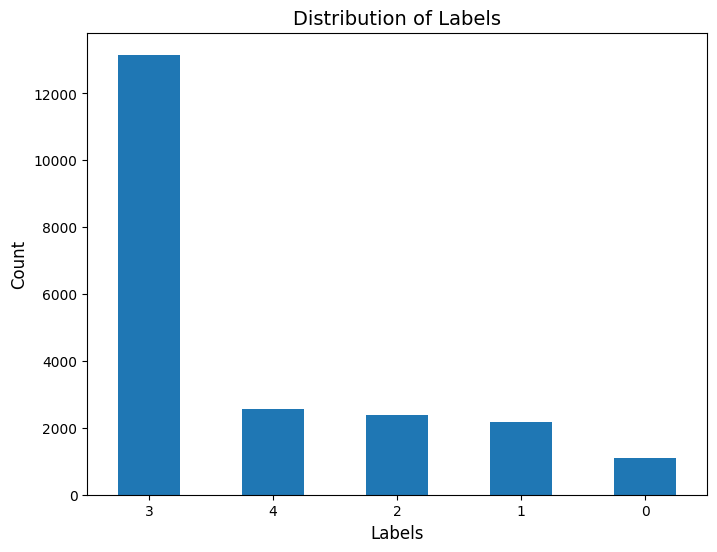

In [18]:
plt.figure(figsize=(8, 6))
df['label'].value_counts().plot(kind='bar')
plt.title('Distribution of Labels', fontsize=14)
plt.xlabel('Labels', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=0)
plt.show()

## Data Processing

### train/test/validation

In [49]:
# Data is first split into train/test/validation to avoid data leakage before augmenting.

In [19]:
train_val_df, test_df = train_test_split(
    df,
    test_size=0.2,
    random_state=random_seed,
    stratify=df['label']
)

train_df, val_df = train_test_split(
    train_val_df,
    test_size=0.25,
    random_state=random_seed,
    stratify=train_val_df['label']
)

### Stratification

In [20]:
# Verify stratification
print("Original dataset class distribution:")
print(df['label'].value_counts(normalize=True))
print("\nTrain set class distribution:")
print(train_df['label'].value_counts(normalize=True))
print("\nValidation set class distribution:")
print(val_df['label'].value_counts(normalize=True))
print("\nTest set class distribution:")
print(test_df['label'].value_counts(normalize=True))

Original dataset class distribution:
label
3    0.614946
4    0.120437
2    0.111511
1    0.102304
0    0.050802
Name: proportion, dtype: float64

Train set class distribution:
label
3    0.614941
4    0.120433
2    0.111553
1    0.102282
0    0.050791
Name: proportion, dtype: float64

Validation set class distribution:
label
3    0.614953
4    0.120327
2    0.111449
1    0.102336
0    0.050935
Name: proportion, dtype: float64

Test set class distribution:
label
3    0.614953
4    0.120561
2    0.111449
1    0.102336
0    0.050701
Name: proportion, dtype: float64


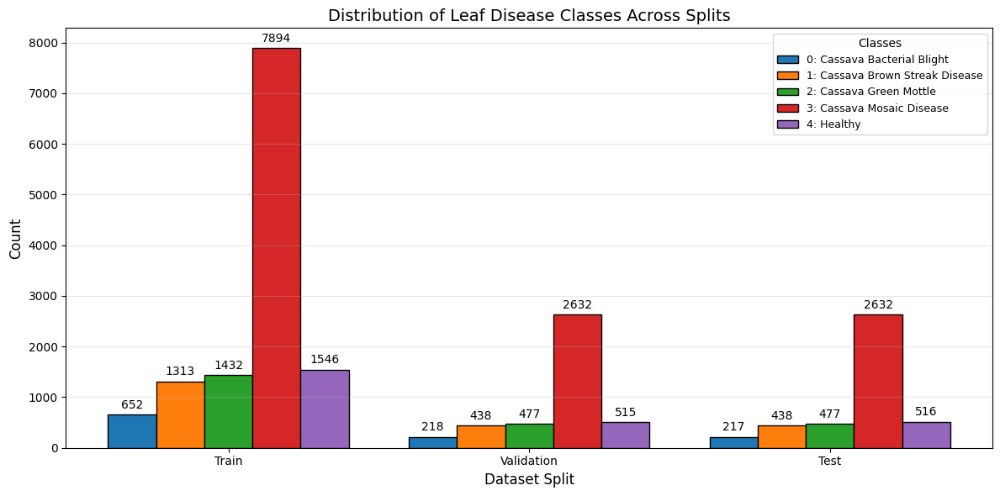

In [21]:
counts_df1 = train_df['label'].value_counts().sort_index()
counts_df2 = val_df['label'].value_counts().sort_index()
counts_df3 = test_df['label'].value_counts().sort_index()

class_values = [0, 1, 2, 3, 4]
class_labels = ["0: Cassava Bacterial Blight", "1: Cassava Brown Streak Disease", "2: Cassava Green Mottle", "3: Cassava Mosaic Disease", "4: Healthy"]

splits = ['Train', 'Validation', 'Test']
all_counts = [counts_df1, counts_df2, counts_df3]

data = np.array([[counts.get(c, 0) for counts in all_counts]for c in class_values])

x = np.arange(len(splits))
n_classes = len(class_values)
bar_width = 0.8 / n_classes

fig, ax = plt.subplots(figsize=(12, 6))

colors = plt.cm.tab10.colors

for i in range(n_classes):
    ax.bar(
        x + (i - n_classes/2) * bar_width + bar_width/2,
        data[i],
        width=bar_width,
        label=class_labels[i],
        edgecolor='black',
        color=colors[i]
    )

ax.set_xlabel('Dataset Split', fontsize=12)
ax.set_ylabel('Count', fontsize=12)
ax.set_title('Distribution of Leaf Disease Classes Across Splits', fontsize=14)
ax.set_xticks(x)
ax.set_xticklabels(splits)

ax.legend(title="Classes", fontsize=9)
ax.grid(axis='y', alpha=0.3)

for bars in ax.containers:
    ax.bar_label(bars, padding=3)

plt.tight_layout()
plt.show()

In [22]:
train_df["label"] = train_df["label"].astype(str)
val_df["label"] = val_df["label"].astype(str)
test_df["label"] = test_df["label"].astype(str)

### Class weights

In [25]:
# Compute class weights
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_df['label']),
    y=train_df['label']
)

class_weight_dict = dict(enumerate(class_weights))
class_weight_dict

{0: np.float64(3.937730061349693),
 1: np.float64(1.9553693830921555),
 2: np.float64(1.792877094972067),
 3: np.float64(0.3252343552064859),
 4: np.float64(1.6606727037516171)}

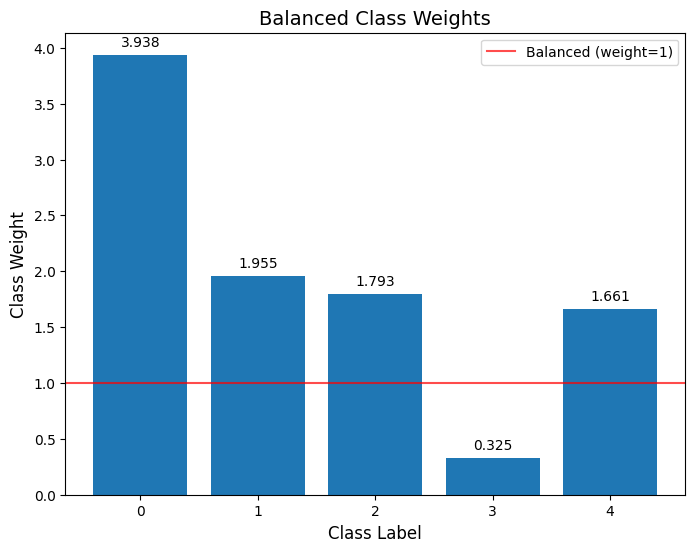

In [26]:
plt.figure(figsize=(8, 6))
classes = list(class_weight_dict.keys())
weights = list(class_weight_dict.values())

bars = plt.bar(classes, weights)

for bar, weight in zip(bars, weights):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.05,
             f'{weight:.3f}', ha='center', va='bottom', fontsize=10)

plt.axhline(y=1, color='red', linestyle='-', label='Balanced (weight=1)', alpha=0.7)

plt.title('Balanced Class Weights', fontsize=14)
plt.xlabel('Class Label', fontsize=12)
plt.ylabel('Class Weight', fontsize=12)
plt.legend()
plt.xticks(rotation=0)
plt.show()

### Data Augmentation

In [27]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    zoom_range=0.2,
    horizontal_flip=True,
)

val_datagen = ImageDataGenerator(rescale=1./255)

test_generator = ImageDataGenerator(rescale=1./255)

### Data Generator

In [29]:
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    x_col="file_path",
    y_col="label",
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    seed=random_seed

)

val_generator = val_datagen.flow_from_dataframe(
    dataframe=val_df,
    x_col="file_path",
    y_col="label",
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    shuffle=False,
    seed=random_seed
)

test_generator = val_datagen.flow_from_dataframe(
    dataframe=test_df,
    x_col="file_path",
    y_col="label",
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    shuffle=False,
    seed=random_seed
)

Found 12837 validated image filenames belonging to 5 classes.
Found 4280 validated image filenames belonging to 5 classes.
Found 4280 validated image filenames belonging to 5 classes.


# Model Training

In [28]:
BATCH_SIZE = 96
NUM_CLASSES = 5
EPOCHS = 100
IMG_SIZE = 224

## 1. Baseline Simple Model

### Training

In [30]:
model_1 = models.Sequential([
    layers.Conv2D(64, (3,3), activation='relu', input_shape=(IMG_SIZE,IMG_SIZE,3)),
    layers.BatchNormalization(),
    layers.MaxPooling2D(2,2),

    layers.Conv2D(128, (3,3), activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(2,2),

    layers.Conv2D(256, (3,3), activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(2,2),

    layers.Conv2D(512, (3,3), activation='relu'),
    layers.BatchNormalization(),
    layers.GlobalAveragePooling2D(),

    layers.Flatten(),
    layers.Dense(256, activation='relu'),
    layers.Dense(NUM_CLASSES, activation='softmax')
])

model_1.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 222, 222, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 222, 222, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 111, 111, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 109, 109, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 109, 109, 128)  │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 54, 54, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 52, 52, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 52, 52, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 26, 26, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 24, 24, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 24, 24, 512)    │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 5)              │         1,285 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,687,429 (6.44 MB)

 Trainable params: 1,685,509 (6.43 MB)

 Non-trainable params: 1,920 (7.50 KB)

In [33]:
# starts at 0.0001, ramps up to 0.001 over 100 steps, then slowly decays back down to 0.0001 over the following training steps.

lr_schedule = keras.optimizers.schedules.CosineDecay(
    initial_learning_rate=1e-4,  # 0.0001
    decay_steps=1000,
    alpha=0.1,
    warmup_target=1e-3,          # 0.001
    warmup_steps=100
)

In [34]:
model_1.compile(
    optimizer=keras.optimizers.Adam(learning_rate=lr_schedule),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [35]:
es = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
)

In [36]:
mc = ModelCheckpoint('model_1.keras',monitor='val_loss', mode='min', verbose=1, save_best_only=True)

In [37]:
%%time

history_1 = model_1.fit(
    train_generator,
    validation_data=val_generator,
    epochs=EPOCHS,
    callbacks=[es, mc],
    verbose=1 ,
    class_weight=class_weight_dict
)

Epoch 1/100
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.3502 - loss: 1.5637
Epoch 1: val_loss improved from None to 4.42678, saving model to model_1.keras

Epoch 1: finished saving model to model_1.keras
134/134 ━━━━━━━━━━━━━━━━━━━━ 263s 2s/step - accuracy: 0.4021 - loss: 1.5202 - val_accuracy: 0.1208 - val_loss: 4.4268
Epoch 2/100
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.4686 - loss: 1.4156
Epoch 2: val_loss improved from 4.42678 to 4.14592, saving model to model_1.keras

Epoch 2: finished saving model to model_1.keras
134/134 ━━━━━━━━━━━━━━━━━━━━ 192s 1s/step - accuracy: 0.4791 - loss: 1.3895 - val_accuracy: 0.0839 - val_loss: 4.1459
Epoch 3/100
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.5309 - loss: 1.2819
Epoch 3: val_loss improved from 4.14592 to 3.44144, saving model to model_1.keras

Epoch 3: finished saving model to model_1.keras
134/134 ━━━━━━━━━━━━━━━━━━━━ 198s 1s/step - accuracy: 0.5398 - loss: 1.2628 - val_accuracy: 0.1140 - val_loss: 3.441

In [38]:
model_1=keras.models.load_model('model_1.keras')

### Evaluating

In [39]:
model_1.evaluate(test_generator)

45/45 ━━━━━━━━━━━━━━━━━━━━ 20s 429ms/step - accuracy: 0.7734 - loss: 0.6473


[0.6473292708396912, 0.7733644843101501]

In [40]:
pred_probs = model_1.predict(test_generator)

predictions = np.argmax(pred_probs, axis=1)

45/45 ━━━━━━━━━━━━━━━━━━━━ 19s 411ms/step


In [41]:
pred_labels = np.argmax(pred_probs, axis=1)
true_labels = test_generator.classes

In [42]:
ErrorMetrics = []

In [43]:
metrics = {
    "Accuracy": accuracy_score(true_labels, predictions),
    "Precision": precision_score(true_labels, predictions, average="macro"),
    "Recall": recall_score(true_labels, predictions, average="macro"),
    "F1_Score": f1_score(true_labels, predictions, average="macro")
}

ErrorMetrics.append(metrics)

ErrorMetrics_pd = pd.DataFrame(ErrorMetrics)

print(ErrorMetrics_pd)

   Accuracy  Precision    Recall  F1_Score
0  0.773364   0.633636  0.629487  0.620552


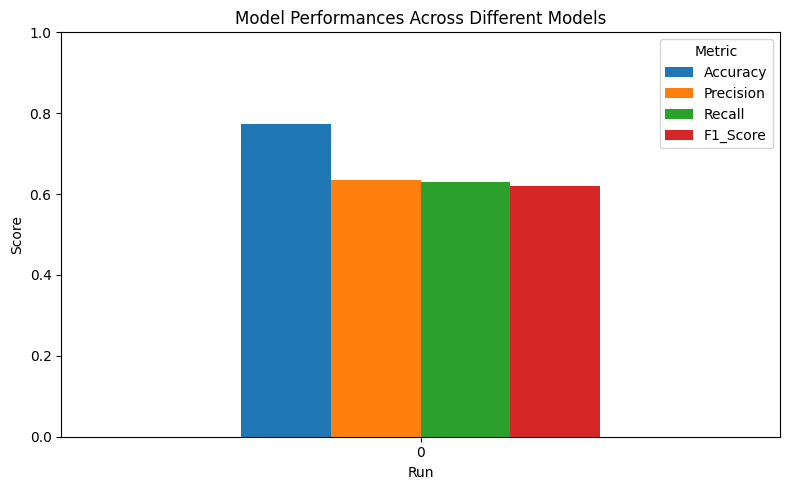

In [44]:
ErrorMetrics_pd.plot(kind="bar", figsize=(8, 5))

plt.title("Model Performances Across Different Models")
plt.xlabel("Run")
plt.ylabel("Score")
plt.ylim(0, 1)
plt.xticks(rotation=0)
plt.legend(title="Metric")
plt.tight_layout()
plt.show()

In [45]:
class_labels = list(test_generator.class_indices.keys())

print(classification_report(true_labels, pred_labels, target_names=class_labels))

              precision    recall  f1-score   support

           0       0.47      0.31      0.37       217
           1       0.64      0.70      0.67       438
           2       0.67      0.54      0.60       477
           3       0.94      0.88      0.91      2632
           4       0.46      0.72      0.56       516

    accuracy                           0.77      4280
   macro avg       0.63      0.63      0.62      4280
weighted avg       0.80      0.77      0.78      4280



In [46]:
cm = confusion_matrix(true_labels, pred_labels)
print(cm)

[[  67   45    9   10   86]
 [  19  306    8   34   71]
 [   7   25  259   67  119]
 [   5   70   83 2306  168]
 [  45   34   30   35  372]]


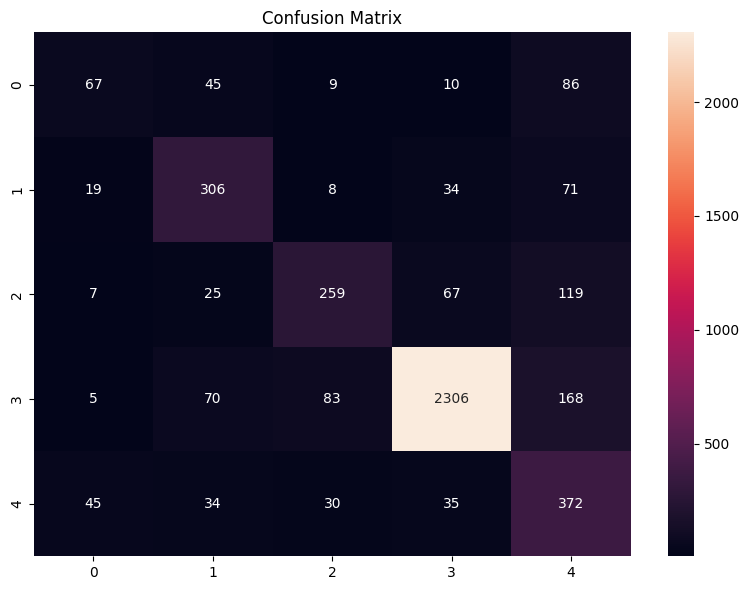

In [47]:
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=class_labels, yticklabels=class_labels, cbar=True)
plt.title("Confusion Matrix")
plt.tight_layout()
plt.show()

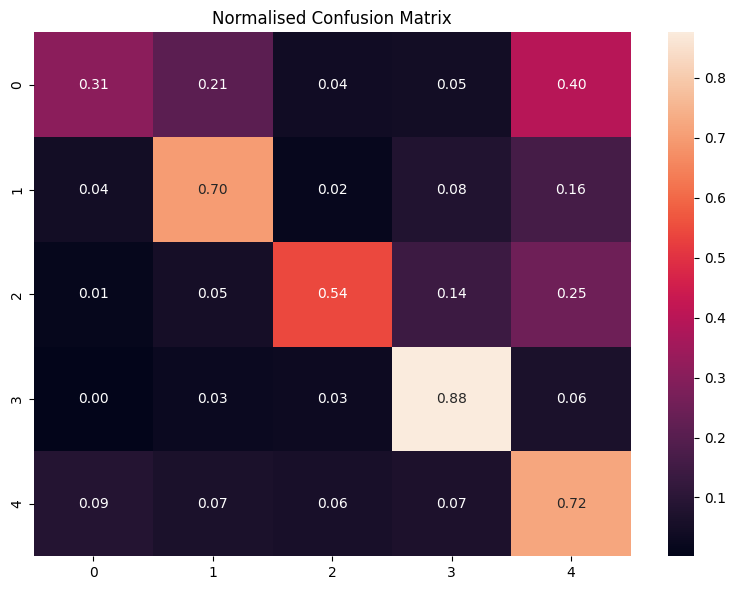

In [48]:
cm_normalised = cm.astype('float') / cm.sum(axis=1, keepdims=True)

plt.figure(figsize=(8,6))
sns.heatmap(cm_normalised, annot=True, fmt='.2f', xticklabels=class_labels, yticklabels=class_labels, cbar=True)
plt.title("Normalised Confusion Matrix")
plt.tight_layout()
plt.show()

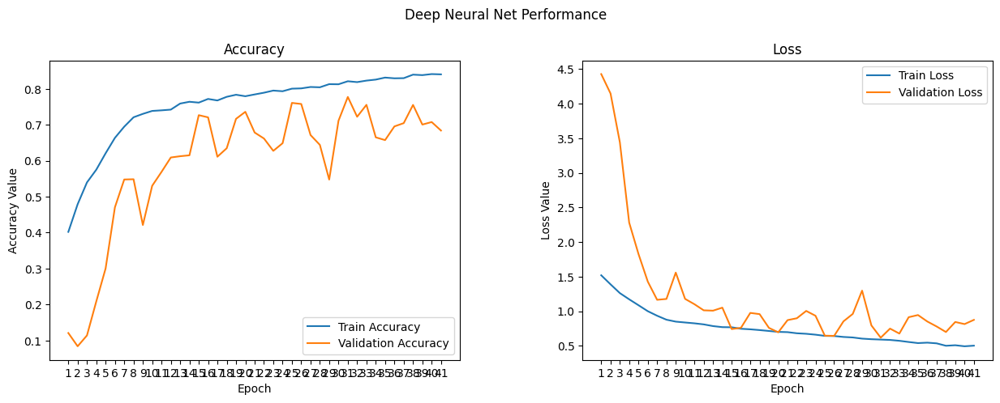

In [52]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
t = f.suptitle('Deep Neural Net Performance', fontsize=12)
f.subplots_adjust(top=0.85, wspace=0.3)

epochs = list(range(1,41+1))
ax1.plot(epochs, history_1.history['accuracy'], label='Train Accuracy')
ax1.plot(epochs, history_1.history['val_accuracy'], label='Validation Accuracy')
ax1.set_xticks(epochs)
ax1.set_ylabel('Accuracy Value')
ax1.set_xlabel('Epoch')
ax1.set_title('Accuracy')
l1 = ax1.legend(loc="best")

ax2.plot(epochs, history_1.history['loss'], label='Train Loss')
ax2.plot(epochs, history_1.history['val_loss'], label='Validation Loss')
ax2.set_xticks(epochs)
ax2.set_ylabel('Loss Value')
ax2.set_xlabel('Epoch')
ax2.set_title('Loss')
l2 = ax2.legend(loc="best")

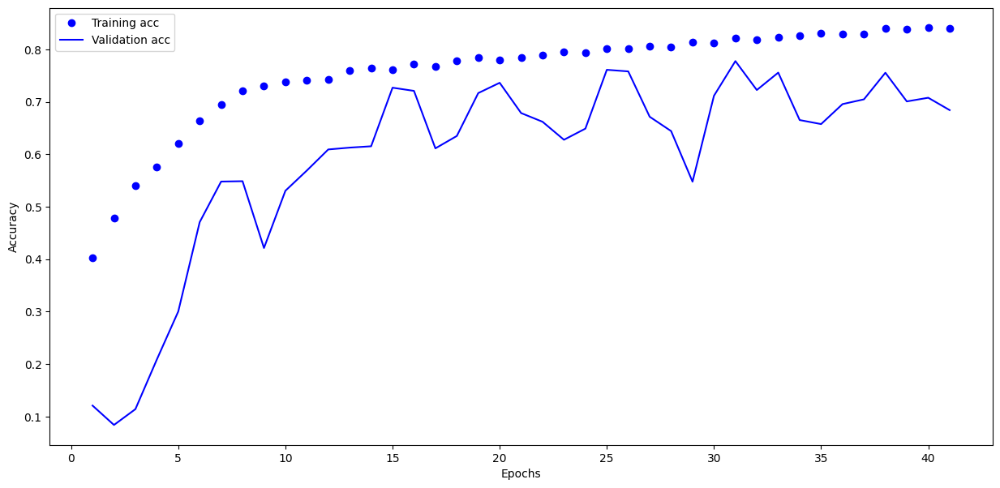

In [53]:
history_dict = history_1.history

acc_values = history_dict['accuracy']
val_acc_values = history_dict['val_accuracy']
epochs = range(1, len(acc_values) + 1)

plt.figure(num=1, figsize=(15,7))
plt.plot(epochs, acc_values, 'bo', label='Training acc')
plt.plot(epochs, val_acc_values, 'b', label='Validation acc')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.show()

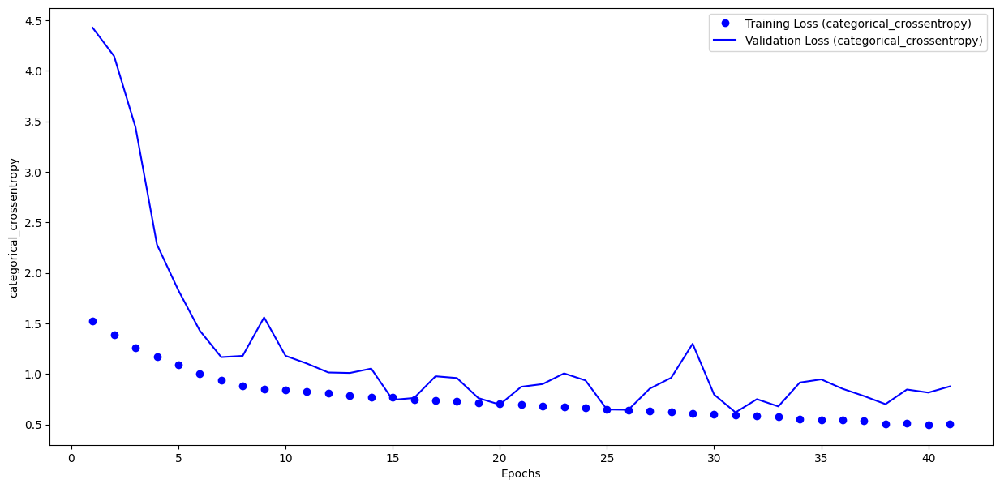

In [54]:
history_dict = history_1.history

acc_values = history_dict['loss']
val_acc_values = history_dict['val_loss']
epochs = range(1, len(acc_values) + 1)

plt.figure(num=1, figsize=(15, 7))
plt.plot(epochs, acc_values, 'bo', label='Training Loss (categorical_crossentropy)')
plt.plot(epochs, val_acc_values, 'b', label='Validation Loss (categorical_crossentropy)')
plt.xlabel('Epochs')
plt.ylabel('categorical_crossentropy')
plt.legend()

plt.show()

In [55]:
def plot_image(i, predictions_array, true_label, img):
    true_label_i = true_label[i]
    img_i = img[i]

    plt.grid(False)
    plt.xticks([])
    plt.yticks([])

    plt.imshow(img_i)

    predicted_label = np.argmax(predictions_array)
    color = 'blue' if predicted_label == true_label_i else 'red'

    plt.xlabel("{} {:2.0f}% ({})".format(
        class_names[predicted_label],
        100 * np.max(predictions_array),
        class_names[true_label_i]
    ), color=color)


def plot_value_array(i, predictions_array, true_label):
    true_label_i = true_label[i]

    plt.grid(False)
    plt.xticks(range(NUM_CLASSES))
    plt.yticks([])

    thisplot = plt.bar(range(NUM_CLASSES), predictions_array)
    plt.ylim([0, 1])

    predicted_label = np.argmax(predictions_array)

    thisplot[predicted_label].set_color('red')
    thisplot[true_label_i].set_color('blue')

3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step


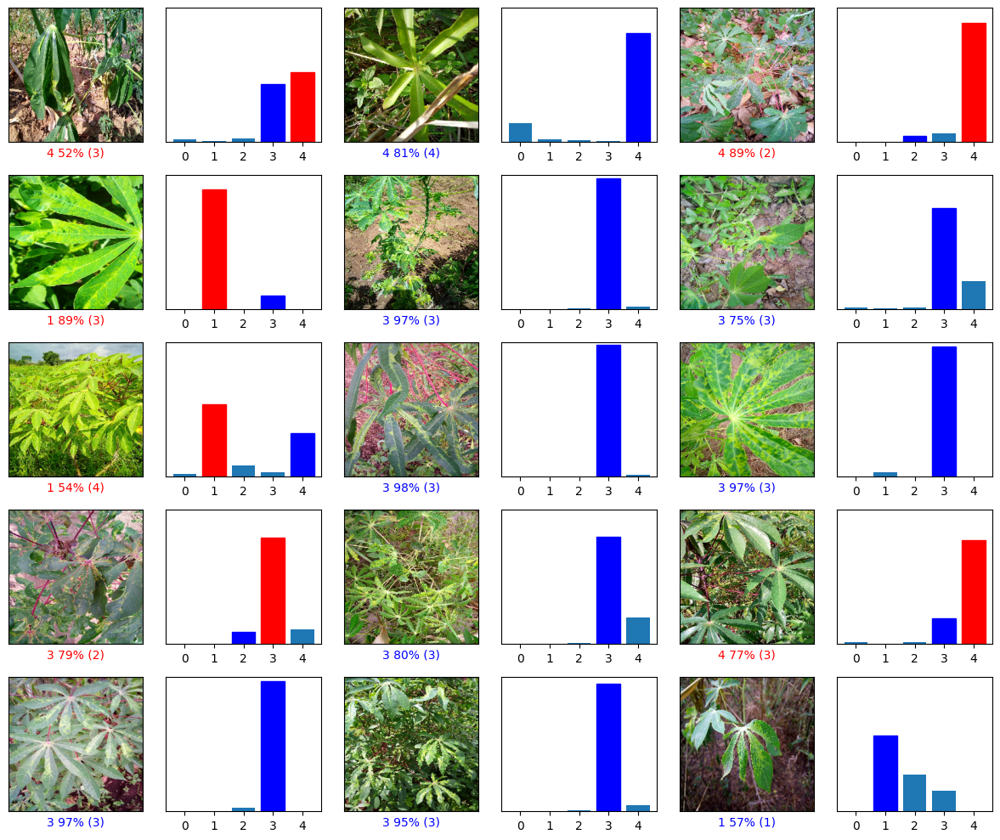

In [56]:
class_indices = train_generator.class_indices
class_names = {v: k for k, v in class_indices.items()}

NUM_CLASSES = len(class_names)

images, labels_batch = next(test_generator)
true_labels_batch = np.argmax(labels_batch, axis=1)

batch_pred_probs = model_1.predict(images)

num_rows = 5
num_cols = 3
num_images = num_rows * num_cols

plt.figure(figsize=(2 * 2 * num_cols, 2 * num_rows))

for i in range(num_images):

    plt.subplot(num_rows, 2 * num_cols, 2 * i + 1)
    plot_image(i, batch_pred_probs[i], true_labels_batch, images)

    plt.subplot(num_rows, 2 * num_cols, 2 * i + 2)
    plot_value_array(i, batch_pred_probs[i], true_labels_batch)

plt.tight_layout()
plt.show()

In [57]:
test_generator.reset()

y_pred_probs = model_1.predict(test_generator, verbose=1)
y_true = np.asarray(test_generator.classes)

class_indices = test_generator.class_indices
class_names = [class_name for class_name, class_id in sorted(class_indices.items(), key=lambda x: x[1])]

num_classes = y_pred_probs.shape[1]

macro_auc = roc_auc_score(y_true, y_pred_probs, multi_class="ovr", average="macro")

y_true_onehot = label_binarize(y_true, classes=np.arange(num_classes))

per_class_auc = roc_auc_score(y_true_onehot, y_pred_probs, average=None)

auc_df = pd.DataFrame({"class": class_names, "roc_auc": per_class_auc})

print(f"\nMacro ROC AUC: {macro_auc:.4f}\n")
print(auc_df)

45/45 ━━━━━━━━━━━━━━━━━━━━ 19s 415ms/step

Macro ROC AUC: 0.9223

  class   roc_auc
0     0  0.911712
1     1  0.938750
2     2  0.893596
3     3  0.961444
4     4  0.906079


In [58]:
ROC_AUC = []

In [59]:
roc_auc = {"Macro ROC AUC": macro_auc}

for class_name, auc_value in zip(class_names, per_class_auc):
    roc_auc[class_name] = auc_value

ROC_AUC.append(roc_auc)

ROC_AUC_pd = pd.DataFrame(ROC_AUC)

print(ROC_AUC_pd)

   Macro ROC AUC         0        1         2         3         4
0       0.922316  0.911712  0.93875  0.893596  0.961444  0.906079


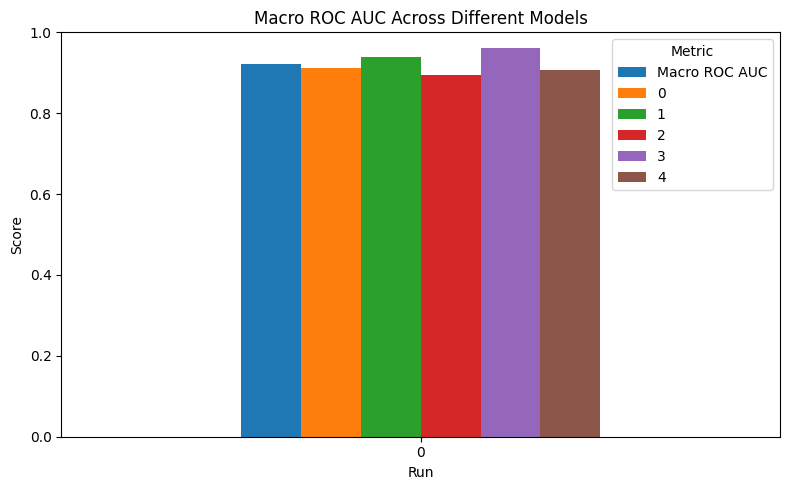

In [60]:
ROC_AUC_pd.plot(kind="bar", figsize=(8, 5))

plt.title("Macro ROC AUC Across Different Models")
plt.xlabel("Run")
plt.ylabel("Score")
plt.ylim(0, 1)
plt.xticks(rotation=0)
plt.legend(title="Metric")
plt.tight_layout()
plt.show()

## 2. Model Search Space

### Training

In [61]:
def build_cnn_model(hp):
    model = models.Sequential()
    model.add(layers.Conv2D(filters=hp.Int('conv1_filters', 16, 64, step=16), kernel_size=hp.Choice('conv1_kernel', [3, 5]), activation='relu', input_shape=(IMG_SIZE,IMG_SIZE,3)))
    model.add(layers.MaxPooling2D(2,2))
    model.add(layers.Dropout(hp.Float('dropout1', 0, 0.3, step=0.1)))

    model.add(layers.Conv2D(filters=hp.Int('conv2_filters', 64, 128, step=32), kernel_size=hp.Choice('conv2_kernel', [3, 5]), activation='relu'))
    model.add(layers.MaxPooling2D(2,2))
    model.add(layers.Dropout(hp.Float('dropout2', 0, 0.3, step=0.1)))

    model.add(layers.Conv2D(filters=hp.Int('conv3_filters', 128, 256, step=64), kernel_size=3, activation='relu'))
    model.add(layers.MaxPooling2D(2,2))
    model.add(layers.Dropout(hp.Float('dropout3', 0.1, 0.4, step=0.1)))

    if hp.Boolean('use_conv4'):
        model.add(layers.Conv2D(filters=hp.Int('conv4_filters', 256, 512, step=128), kernel_size=3, activation='relu'))
        model.add(layers.MaxPooling2D(2,2))
        model.add(layers.Dropout(hp.Float('dropout4', 0.2, 0.5, step=0.1)))

    model.add(layers.Flatten())
    model.add(layers.Dense(units=hp.Int('dense1_units', 128, 512, step=128), activation='relu'))
    model.add(layers.Dropout(hp.Float('dense_dropout', 0.3, 0.6, step=0.1)))

    if hp.Boolean('use_dense2'):
        model.add(layers.Dense(units=hp.Int('dense2_units', 64, 256, step=64), activation='relu'))
        model.add(layers.Dropout(0.3))

    model.add(layers.Dense(NUM_CLASSES, activation='softmax'))

    learning_rate = hp.Choice('lr', [1e-5, 1e-4, 5e-4, 1e-3])

    optimizer_choice = hp.Choice('optimizer', ['adam', 'adamw', 'rmsprop'])

    if optimizer_choice == 'adam':
        optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
    elif optimizer_choice == 'adamw':
        optimizer = tf.keras.optimizers.AdamW(learning_rate=learning_rate, weight_decay=hp.Float('weight_decay', 1e-5, 1e-3, sampling='log'))
    else:
        optimizer = tf.keras.optimizers.RMSprop(learning_rate=learning_rate)

    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    return model

In [62]:
tuner = RandomSearch(
    build_cnn_model,
    objective='val_accuracy',
    max_trials=6,
    executions_per_trial=2,
    directory='my_dir',
    project_name='CNN_tuning'
)

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [63]:
es = EarlyStopping(
    monitor='val_loss',
    patience=4,
    restore_best_weights=True
)

In [64]:
tuner.search(
    train_generator,
    validation_data=val_generator,
    epochs=10,
    callbacks=[es],
    class_weight=class_weight_dict,
    verbose=1
)

Trial 6 Complete [00h 53m 56s]
val_accuracy: 0.605490654706955

Best val_accuracy So Far: 0.6355140209197998
Total elapsed time: 05h 51m 27s


In [65]:
best_model = tuner.get_best_models(num_models=1)[0]

print(best_model.summary())

/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:797: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 222, 222, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 111, 111, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 111, 111, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 107, 107, 64)   │       102,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 53, 53, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 53, 53, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 51, 51, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 25, 25, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 25, 25, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 23, 23, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 11, 11, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 11, 11, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 30976)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     3,965,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 5)              │           325 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,446,917 (16.96 MB)

 Trainable params: 4,446,917 (16.96 MB)

 Non-trainable params: 0 (0.00 B)

None


In [66]:
mc = ModelCheckpoint('best_optim_model.keras', monitor='val_loss', mode='min', verbose=1, save_best_only=True)

In [67]:
es = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
)

In [68]:
%%time

history_2 = best_model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=EPOCHS,
    callbacks=[es, mc],
    verbose=1 ,
    class_weight=class_weight_dict
)

Epoch 1/100
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.4257 - loss: 1.4459
Epoch 1: val_loss improved from None to 1.22909, saving model to best_optim_model.keras

Epoch 1: finished saving model to best_optim_model.keras
134/134 ━━━━━━━━━━━━━━━━━━━━ 198s 1s/step - accuracy: 0.4429 - loss: 1.4367 - val_accuracy: 0.5343 - val_loss: 1.2291
Epoch 2/100
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.4415 - loss: 1.4318
Epoch 2: val_loss did not improve from 1.22909
134/134 ━━━━━━━━━━━━━━━━━━━━ 190s 1s/step - accuracy: 0.4489 - loss: 1.4183 - val_accuracy: 0.4577 - val_loss: 1.2622
Epoch 3/100
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.4521 - loss: 1.4123
Epoch 3: val_loss improved from 1.22909 to 1.21381, saving model to best_optim_model.keras

Epoch 3: finished saving model to best_optim_model.keras
134/134 ━━━━━━━━━━━━━━━━━━━━ 188s 1s/step - accuracy: 0.4619 - loss: 1.3945 - val_accuracy: 0.5000 - val_loss: 1.2138
Epoch 4/100
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 1s

In [69]:
best_optim_model=keras.models.load_model('best_optim_model.keras')

### Evaluating

In [70]:
best_optim_model.evaluate(test_generator)

45/45 ━━━━━━━━━━━━━━━━━━━━ 19s 413ms/step - accuracy: 0.6065 - loss: 1.0348


[1.0347954034805298, 0.6065420508384705]

In [71]:
pred_probs = best_optim_model.predict(test_generator)

predictions = np.argmax(pred_probs, axis=1)

45/45 ━━━━━━━━━━━━━━━━━━━━ 19s 402ms/step


In [72]:
pred_labels = np.argmax(pred_probs, axis=1)
true_labels = test_generator.classes

In [73]:
metrics = {
    "Accuracy": accuracy_score(true_labels, predictions),
    "Precision": precision_score(true_labels, predictions, average="macro"),
    "Recall": recall_score(true_labels, predictions, average="macro"),
    "F1_Score": f1_score(true_labels, predictions, average="macro")
}

ErrorMetrics.append(metrics)

ErrorMetrics_pd = pd.DataFrame(ErrorMetrics)

print(ErrorMetrics_pd)

   Accuracy  Precision    Recall  F1_Score
0  0.773364   0.633636  0.629487  0.620552
1  0.606542   0.454073  0.527672  0.465028


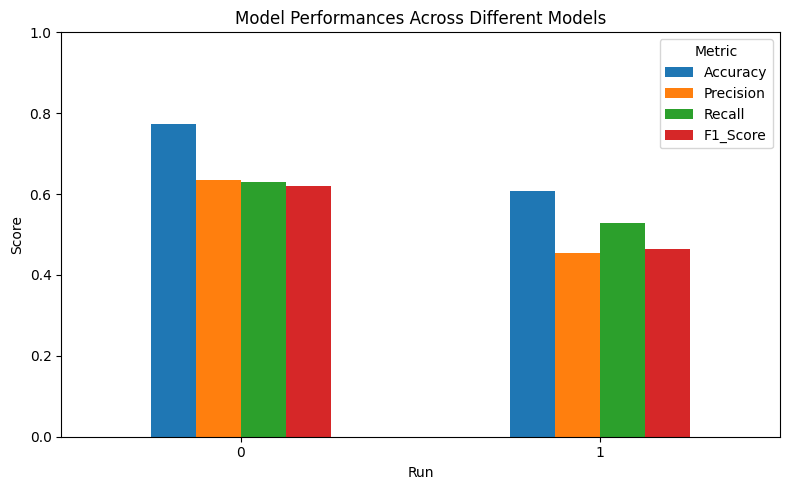

In [74]:
ErrorMetrics_pd.plot(kind="bar", figsize=(8, 5))

plt.title("Model Performances Across Different Models")
plt.xlabel("Run")
plt.ylabel("Score")
plt.ylim(0, 1)
plt.xticks(rotation=0)
plt.legend(title="Metric")
plt.tight_layout()
plt.show()

In [75]:
class_labels = list(test_generator.class_indices.keys())

print(classification_report(true_labels, pred_labels, target_names=class_labels))

              precision    recall  f1-score   support

           0       0.28      0.70      0.40       217
           1       0.39      0.37      0.38       438
           2       0.29      0.50      0.37       477
           3       0.92      0.70      0.80      2632
           4       0.39      0.36      0.38       516

    accuracy                           0.61      4280
   macro avg       0.45      0.53      0.47      4280
weighted avg       0.70      0.61      0.64      4280



In [76]:
cm = confusion_matrix(true_labels, pred_labels)
print(cm)

[[ 151   20   12    4   30]
 [ 111  164   37   67   59]
 [  41   28  238   69  101]
 [  65  163  441 1855  108]
 [ 165   42   94   27  188]]


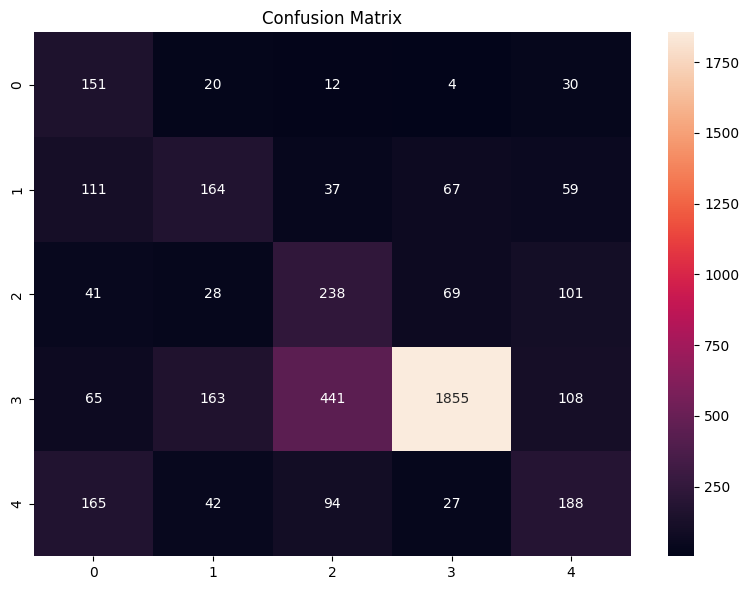

In [77]:
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=class_labels, yticklabels=class_labels, cbar=True)
plt.title("Confusion Matrix")
plt.tight_layout()
plt.show()

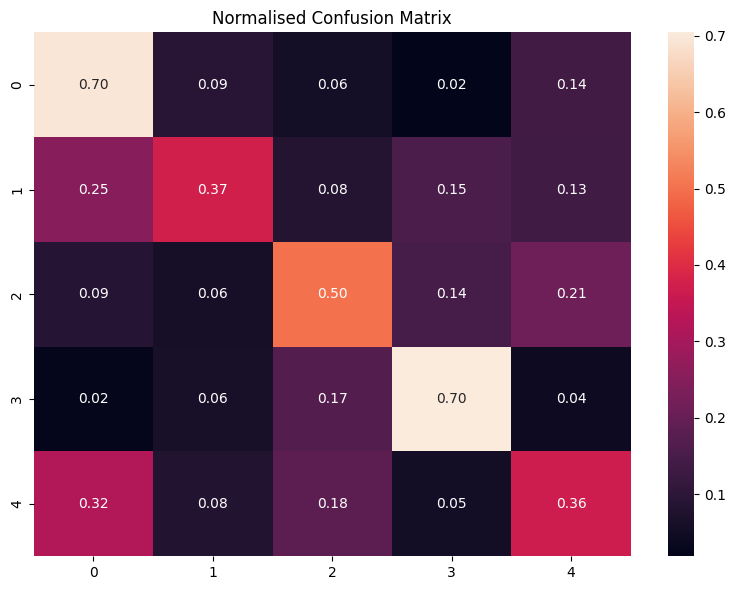

In [78]:
cm_normalised = cm.astype('float') / cm.sum(axis=1, keepdims=True)

plt.figure(figsize=(8,6))
sns.heatmap(cm_normalised, annot=True, fmt='.2f', xticklabels=class_labels, yticklabels=class_labels, cbar=True)
plt.title("Normalised Confusion Matrix")
plt.tight_layout()
plt.show()

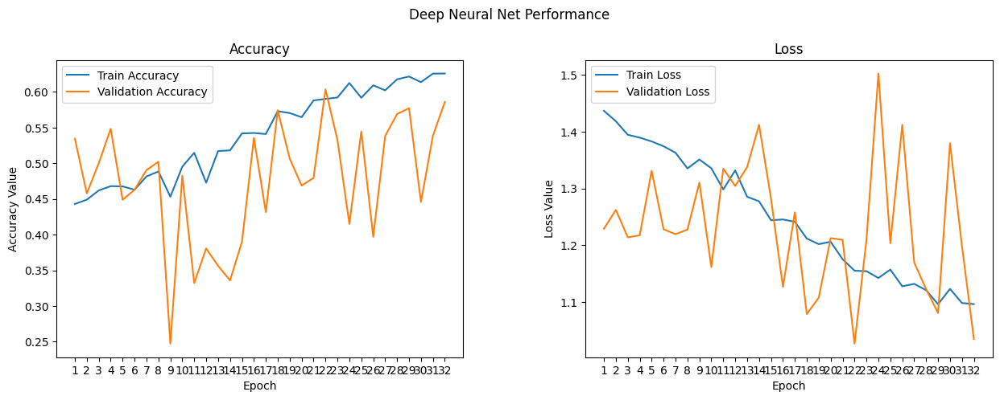

In [80]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
t = f.suptitle('Deep Neural Net Performance', fontsize=12)
f.subplots_adjust(top=0.85, wspace=0.3)

epochs = list(range(1,32+1))
ax1.plot(epochs, history_2.history['accuracy'], label='Train Accuracy')
ax1.plot(epochs, history_2.history['val_accuracy'], label='Validation Accuracy')
ax1.set_xticks(epochs)
ax1.set_ylabel('Accuracy Value')
ax1.set_xlabel('Epoch')
ax1.set_title('Accuracy')
l1 = ax1.legend(loc="best")

ax2.plot(epochs, history_2.history['loss'], label='Train Loss')
ax2.plot(epochs, history_2.history['val_loss'], label='Validation Loss')
ax2.set_xticks(epochs)
ax2.set_ylabel('Loss Value')
ax2.set_xlabel('Epoch')
ax2.set_title('Loss')
l2 = ax2.legend(loc="best")

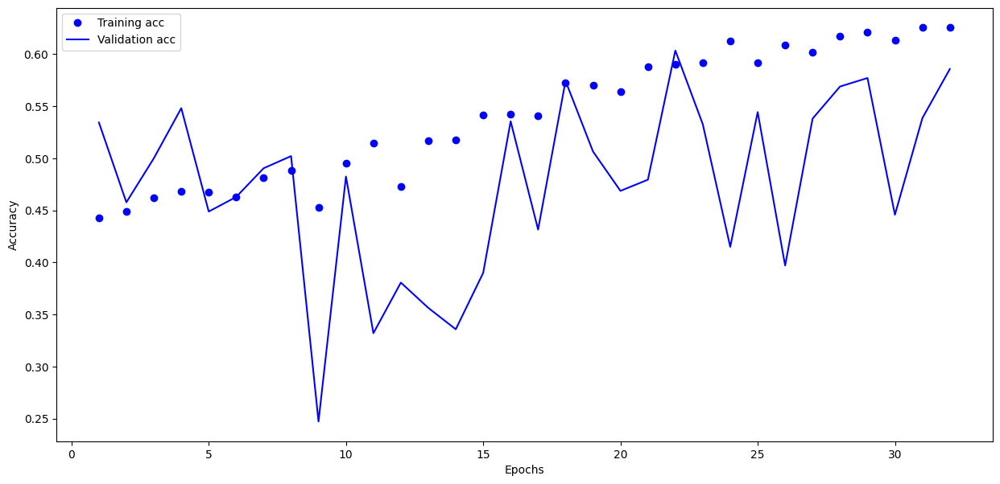

In [81]:
history_dict = history_2.history

acc_values = history_dict['accuracy']
val_acc_values = history_dict['val_accuracy']
epochs = range(1, len(acc_values) + 1)

plt.figure(num=1, figsize=(15,7))
plt.plot(epochs, acc_values, 'bo', label='Training acc')
plt.plot(epochs, val_acc_values, 'b', label='Validation acc')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.show()

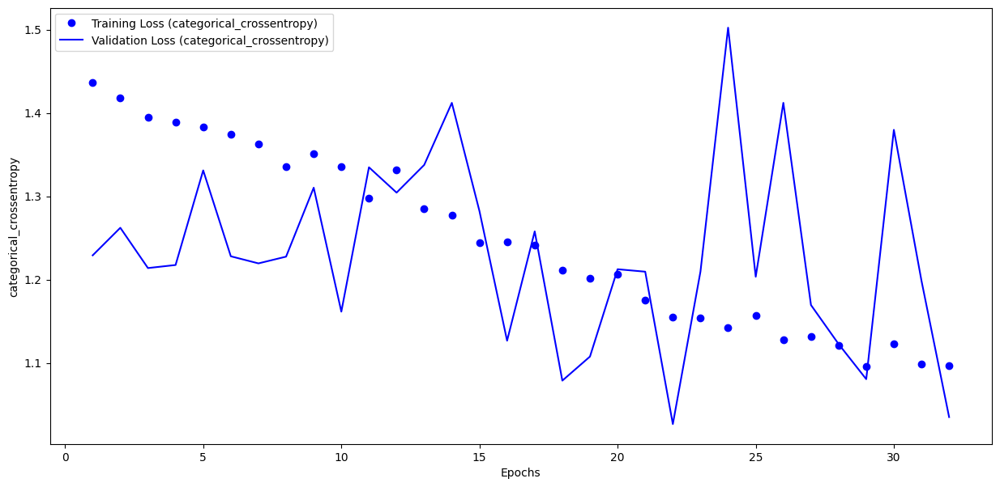

In [82]:
history_dict = history_2.history

acc_values = history_dict['loss']
val_acc_values = history_dict['val_loss']
epochs = range(1, len(acc_values) + 1)

plt.figure(num=1, figsize=(15, 7))
plt.plot(epochs, acc_values, 'bo', label='Training Loss (categorical_crossentropy)')
plt.plot(epochs, val_acc_values, 'b', label='Validation Loss (categorical_crossentropy)')
plt.xlabel('Epochs')
plt.ylabel('categorical_crossentropy')
plt.legend()

plt.show()

3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step


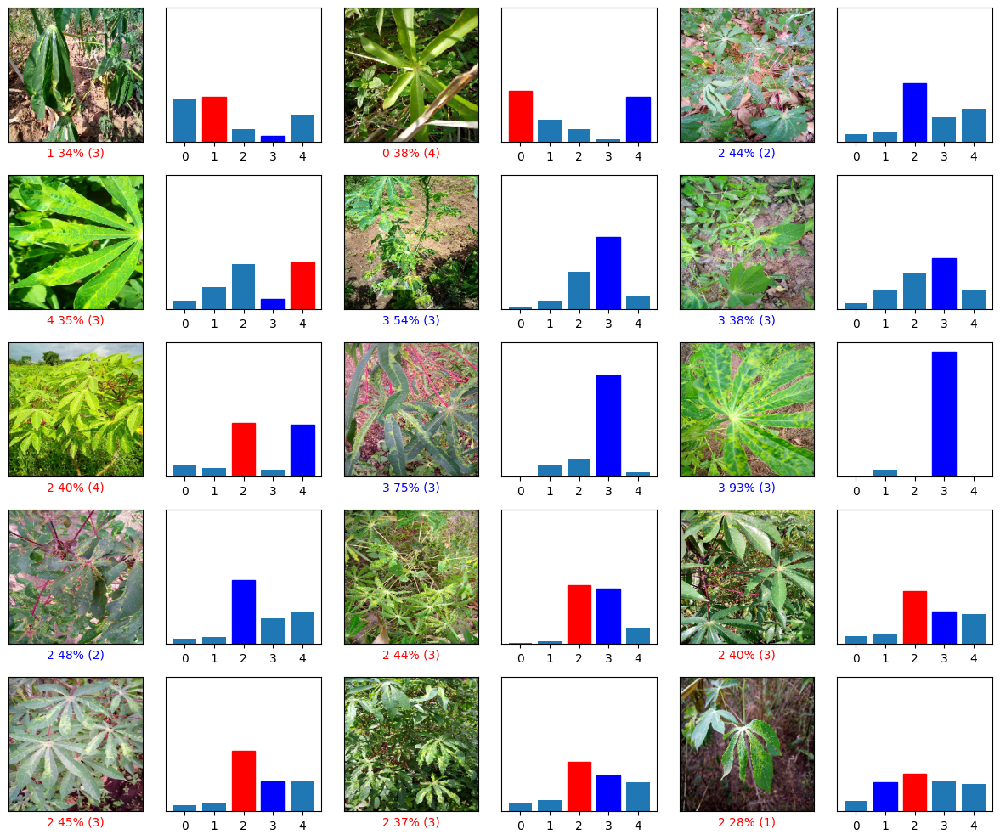

In [83]:
class_indices = train_generator.class_indices
class_names = {v: k for k, v in class_indices.items()}

NUM_CLASSES = len(class_names)

images, labels_batch = next(test_generator)
true_labels_batch = np.argmax(labels_batch, axis=1)

batch_pred_probs = best_optim_model.predict(images)

num_rows = 5
num_cols = 3
num_images = num_rows * num_cols

plt.figure(figsize=(2 * 2 * num_cols, 2 * num_rows))

for i in range(num_images):
    plt.subplot(num_rows, 2 * num_cols, 2 * i + 1)
    plot_image(i, batch_pred_probs[i], true_labels_batch, images)

    plt.subplot(num_rows, 2 * num_cols, 2 * i + 2)
    plot_value_array(i, batch_pred_probs[i], true_labels_batch)

plt.tight_layout()
plt.show()

In [84]:
test_generator.reset()

y_pred_probs = best_optim_model.predict(test_generator, verbose=1)
y_true = np.asarray(test_generator.classes)

class_indices = test_generator.class_indices
class_names = [class_name for class_name, class_id in sorted(class_indices.items(), key=lambda x: x[1])]

num_classes = y_pred_probs.shape[1]

macro_auc = roc_auc_score(y_true, y_pred_probs, multi_class="ovr", average="macro")

y_true_onehot = label_binarize(y_true, classes=np.arange(num_classes))

per_class_auc = roc_auc_score(y_true_onehot, y_pred_probs, average=None)

auc_df = pd.DataFrame({"class": class_names, "roc_auc": per_class_auc})

print(f"\nMacro ROC AUC: {macro_auc:.4f}\n")
print(auc_df)

45/45 ━━━━━━━━━━━━━━━━━━━━ 18s 398ms/step

Macro ROC AUC: 0.8472

  class   roc_auc
0     0  0.910270
1     1  0.840137
2     2  0.740425
3     3  0.896709
4     4  0.848480


In [85]:
roc_auc = {"Macro ROC AUC": macro_auc}

for class_name, auc_value in zip(class_names, per_class_auc):
    roc_auc[class_name] = auc_value

ROC_AUC.append(roc_auc)

ROC_AUC_pd = pd.DataFrame(ROC_AUC)

print(ROC_AUC_pd)

   Macro ROC AUC         0         1         2         3         4
0       0.922316  0.911712  0.938750  0.893596  0.961444  0.906079
1       0.847204  0.910270  0.840137  0.740425  0.896709  0.848480


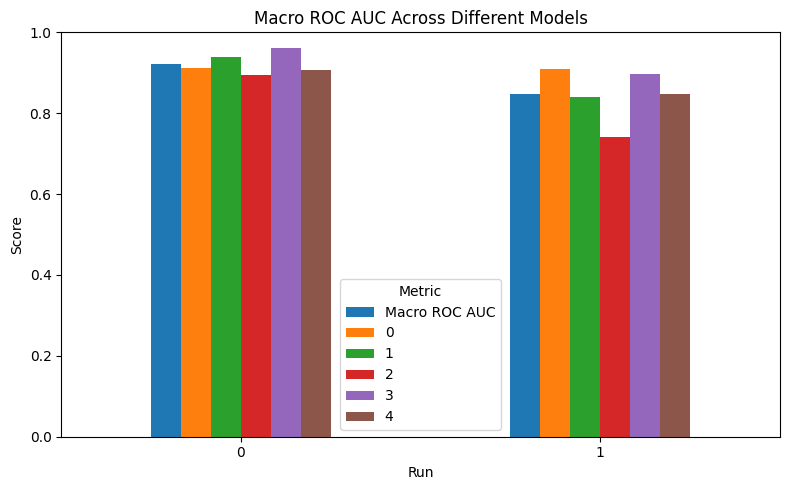

In [86]:
ROC_AUC_pd.plot(kind="bar", figsize=(8, 5))

plt.title("Macro ROC AUC Across Different Models")
plt.xlabel("Run")
plt.ylabel("Score")
plt.ylim(0, 1)
plt.xticks(rotation=0)
plt.legend(title="Metric")
plt.tight_layout()
plt.show()

# Pretrain & Fine Tune Setup

In [87]:
EPOCHS_HEAD = 100 #40
EPOCHS_FINE = 100 #40

# ConvNeXtTiny

## 3. Pretrained ConvNeXtTiny

### Training

In [88]:
base_model = keras.applications.ConvNeXtTiny(include_top=False, weights="imagenet", input_shape=(IMG_SIZE, IMG_SIZE, 3), pooling="avg")

base_model.trainable = False

111650432/111650432 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [89]:
base_model.summary()

Model: "convnext_tiny"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_tiny_pres… │ (None, 224, 224,  │          0 │ input_layer_1[0]… │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_tiny_stem  │ (None, 56, 56,    │      4,896 │ convnext_tiny_pr… │
│ (Sequential)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_tiny_stag… │ (None, 56, 56,    │      4,800 │ convnext_tiny_st… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_tiny_stag… │ (None, 56, 56,    │        192 │ convnext_tiny_st… │
│ (LayerNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_tiny_stag… │ (None, 56, 56,    │     37,248 │ convnext_tiny_st… │
│ (Dense)             │ 384)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_tiny_stag… │ (None, 56, 56,    │          0 │ convnext_tiny_st… │
│ (Activation)        │ 384)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_tiny_stag… │ (None, 56, 56,    │     36,960 │ convnext_tiny_st… │
│ (Dense)             │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_tiny_stag… │ (None, 56, 56,    │         96 │ convnext_tiny_st… │
│ (LayerScale)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_tiny_stag… │ (None, 56, 56,    │          0 │ convnext_tiny_st… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 56, 56,    │          0 │ convnext_tiny_st… │
│                     │ 96)               │            │ convnext_tiny_st… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_tiny_stag… │ (None, 56, 56,    │      4,800 │ add[0][0]         │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_tiny_stag… │ (None, 56, 56,    │        192 │ convnext_tiny_st… │
│ (LayerNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_tiny_stag… │ (None, 56, 56,    │     37,248 │ convnext_tiny_st… │
│ (Dense)             │ 384)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_tiny_stag… │ (None, 56, 56,    │          0 │ convnext_tiny_st… │
│ (Activation)        │ 384)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_tiny_stag… │ (None, 56, 56,    │     36,960 │ convnext_tiny_st… │
│ (Dense)             │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_tiny_stag… │ (None, 56, 56,    │         96 │ convnext_tiny_st

 Total params: 27,820,128 (106.13 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 27,820,128 (106.13 MB)

In [90]:
inputs = keras.Input(shape=(IMG_SIZE, IMG_SIZE, 3))

x = base_model(inputs, training=False)

x = layers.Dropout(0.4)(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)

model_pretrained = keras.Model(inputs, outputs)

In [91]:
model_pretrained.summary()
# model_pretrained.summary(expand_nested=True) # to inspect full model

Model: "functional_40"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_6 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny (Functional)      │ (None, 768)            │    27,820,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 768)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 5)              │         3,845 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 27,823,973 (106.14 MB)

 Trainable params: 3,845 (15.02 KB)

 Non-trainable params: 27,820,128 (106.13 MB)

In [92]:
model_pretrained.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [93]:
mc = ModelCheckpoint('ConvNeXtTiny_pretra_model.keras', monitor='val_loss', mode='min', verbose=1, save_best_only=True)

In [94]:
%%time

history_3 = model_pretrained.fit(
    train_generator,
    validation_data=val_generator,
    epochs=EPOCHS_HEAD,
    callbacks=[es, mc],
    verbose=1 ,
    class_weight=class_weight_dict
)

Epoch 1/100
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.2300 - loss: 1.8698
Epoch 1: val_loss improved from None to 1.40114, saving model to ConvNeXtTiny_pretra_model.keras

Epoch 1: finished saving model to ConvNeXtTiny_pretra_model.keras
134/134 ━━━━━━━━━━━━━━━━━━━━ 227s 2s/step - accuracy: 0.2982 - loss: 1.6948 - val_accuracy: 0.4173 - val_loss: 1.4011
Epoch 2/100
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.3948 - loss: 1.4879
Epoch 2: val_loss did not improve from 1.40114
134/134 ━━━━━━━━━━━━━━━━━━━━ 190s 1s/step - accuracy: 0.4025 - loss: 1.4850 - val_accuracy: 0.2907 - val_loss: 1.5315
Epoch 3/100
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.4073 - loss: 1.4649
Epoch 3: val_loss improved from 1.40114 to 1.35811, saving model to ConvNeXtTiny_pretra_model.keras

Epoch 3: finished saving model to ConvNeXtTiny_pretra_model.keras
134/134 ━━━━━━━━━━━━━━━━━━━━ 196s 1s/step - accuracy: 0.4207 - loss: 1.4442 - val_accuracy: 0.4841 - val_loss: 1.3581
Epoch 4/10

In [95]:
model_pretrained=keras.models.load_model('ConvNeXtTiny_pretra_model.keras')

### Evaluating

In [96]:
model_pretrained.evaluate(test_generator)

45/45 ━━━━━━━━━━━━━━━━━━━━ 28s 493ms/step - accuracy: 0.4888 - loss: 1.3236


[1.323623538017273, 0.488785058259964]

In [97]:
pred_probs = model_pretrained.predict(test_generator)

predictions = np.argmax(pred_probs, axis=1)

45/45 ━━━━━━━━━━━━━━━━━━━━ 27s 498ms/step


In [98]:
pred_labels = np.argmax(pred_probs, axis=1)
true_labels = test_generator.classes

In [99]:
metrics = {
    "Accuracy": accuracy_score(true_labels, predictions),
    "Precision": precision_score(true_labels, predictions, average="macro"),
    "Recall": recall_score(true_labels, predictions, average="macro"),
    "F1_Score": f1_score(true_labels, predictions, average="macro")
}

ErrorMetrics.append(metrics)

ErrorMetrics_pd = pd.DataFrame(ErrorMetrics)

print(ErrorMetrics_pd)

   Accuracy  Precision    Recall  F1_Score
0  0.773364   0.633636  0.629487  0.620552
1  0.606542   0.454073  0.527672  0.465028
2  0.488785   0.362103  0.427039  0.361729


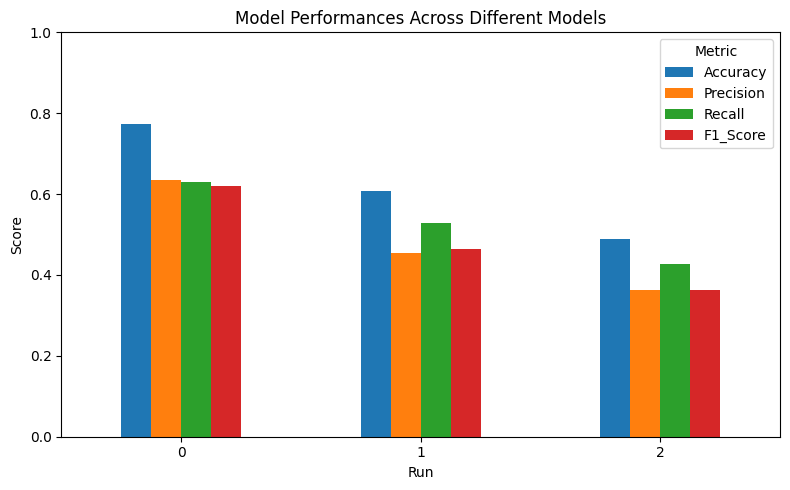

In [100]:
ErrorMetrics_pd.plot(kind="bar", figsize=(8, 5))

plt.title("Model Performances Across Different Models")
plt.xlabel("Run")
plt.ylabel("Score")
plt.ylim(0, 1)
plt.xticks(rotation=0)
plt.legend(title="Metric")
plt.tight_layout()
plt.show()

In [101]:
class_labels = list(test_generator.class_indices.keys())

print(classification_report(true_labels, pred_labels, target_names=class_labels))

              precision    recall  f1-score   support

           0       0.21      0.51      0.30       217
           1       0.25      0.58      0.34       438
           2       0.28      0.25      0.26       477
           3       0.87      0.57      0.68      2632
           4       0.21      0.23      0.22       516

    accuracy                           0.49      4280
   macro avg       0.36      0.43      0.36      4280
weighted avg       0.62      0.49      0.53      4280



In [102]:
cm = confusion_matrix(true_labels, pred_labels)
print(cm)

[[ 111   77    5   10   14]
 [ 105  253   10   30   40]
 [  31  112  118  122   94]
 [ 183  413  233 1490  313]
 [ 102  176   50   68  120]]


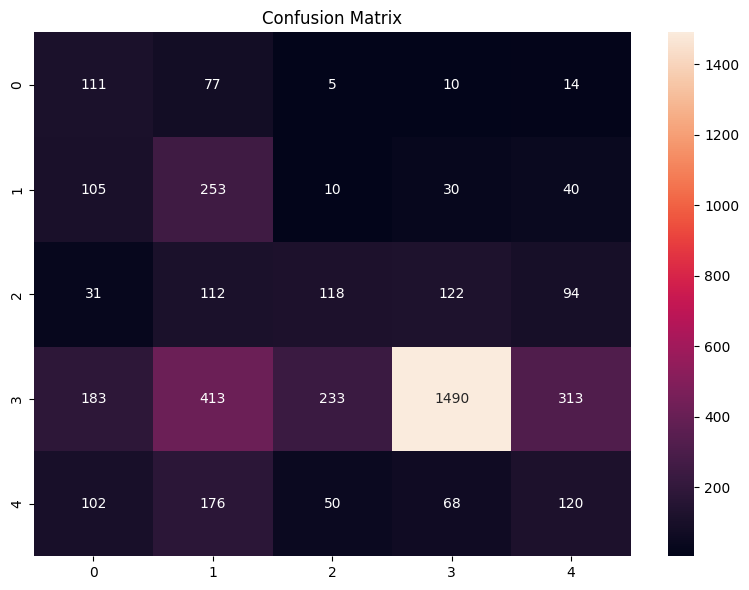

In [103]:
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=class_labels, yticklabels=class_labels, cbar=True)
plt.title("Confusion Matrix")
plt.tight_layout()
plt.show()

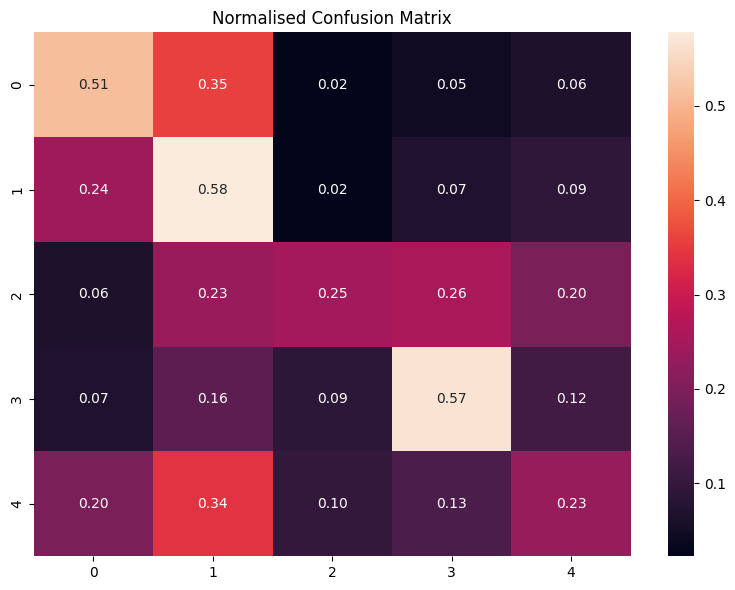

In [104]:
cm_normalised = cm.astype('float') / cm.sum(axis=1, keepdims=True)

plt.figure(figsize=(8,6))
sns.heatmap(cm_normalised, annot=True, fmt='.2f', xticklabels=class_labels, yticklabels=class_labels, cbar=True)
plt.title("Normalised Confusion Matrix")
plt.tight_layout()
plt.show()

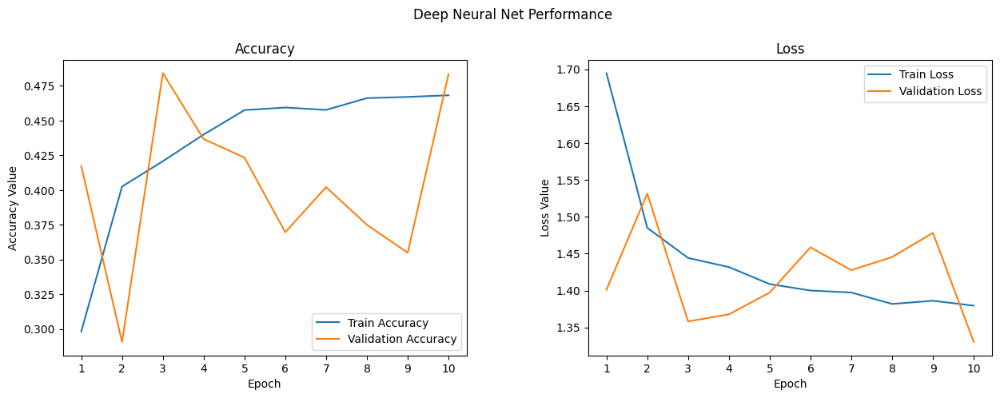

In [105]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
t = f.suptitle('Deep Neural Net Performance', fontsize=12)
f.subplots_adjust(top=0.85, wspace=0.3)

epochs = list(range(1,10+1))
ax1.plot(epochs, history_3.history['accuracy'], label='Train Accuracy')
ax1.plot(epochs, history_3.history['val_accuracy'], label='Validation Accuracy')
ax1.set_xticks(epochs)
ax1.set_ylabel('Accuracy Value')
ax1.set_xlabel('Epoch')
ax1.set_title('Accuracy')
l1 = ax1.legend(loc="best")

ax2.plot(epochs, history_3.history['loss'], label='Train Loss')
ax2.plot(epochs, history_3.history['val_loss'], label='Validation Loss')
ax2.set_xticks(epochs)
ax2.set_ylabel('Loss Value')
ax2.set_xlabel('Epoch')
ax2.set_title('Loss')
l2 = ax2.legend(loc="best")

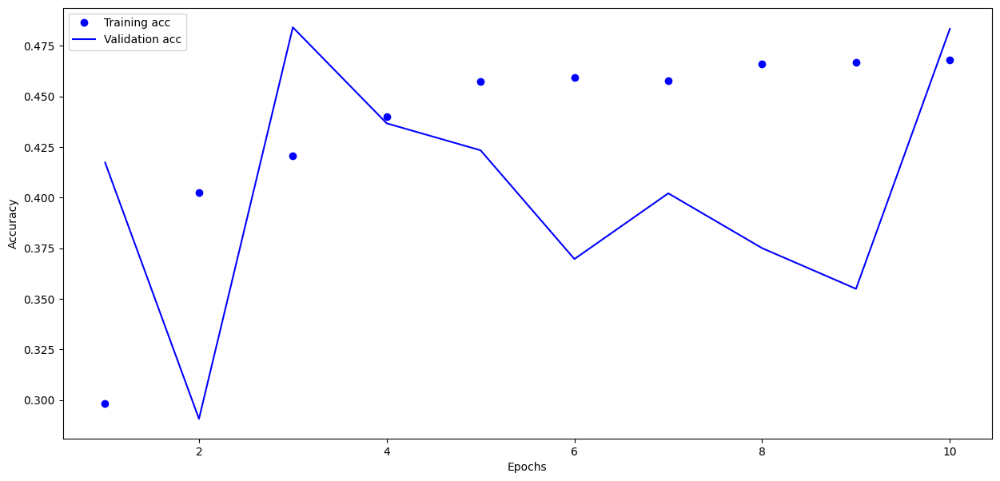

In [106]:
history_dict = history_3.history

acc_values = history_dict['accuracy']
val_acc_values = history_dict['val_accuracy']
epochs = range(1, len(acc_values) + 1)

plt.figure(num=1, figsize=(15,7))
plt.plot(epochs, acc_values, 'bo', label='Training acc')
plt.plot(epochs, val_acc_values, 'b', label='Validation acc')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.show()

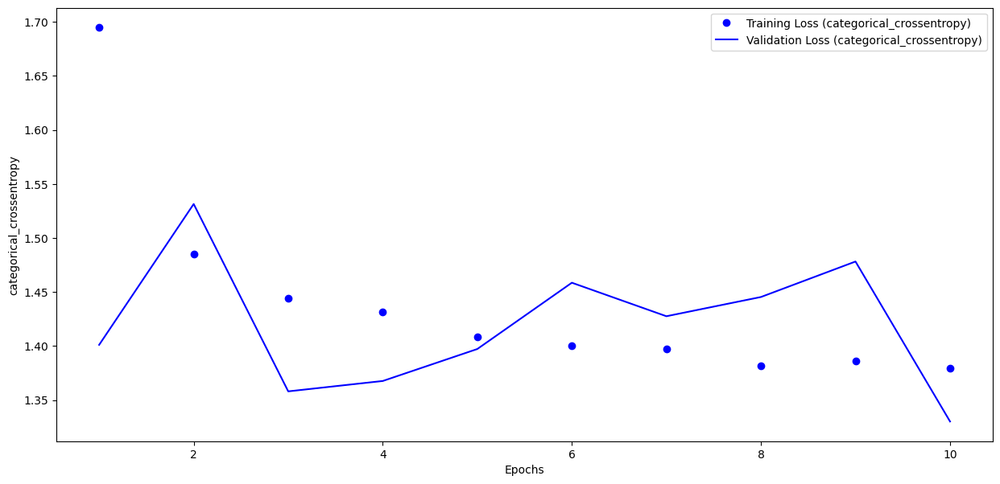

In [107]:
history_dict = history_3.history

acc_values = history_dict['loss']
val_acc_values = history_dict['val_loss']
epochs = range(1, len(acc_values) + 1)

plt.figure(num=1, figsize=(15, 7))
plt.plot(epochs, acc_values, 'bo', label='Training Loss (categorical_crossentropy)')
plt.plot(epochs, val_acc_values, 'b', label='Validation Loss (categorical_crossentropy)')
plt.xlabel('Epochs')
plt.ylabel('categorical_crossentropy')
plt.legend()

plt.show()

3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 122ms/step


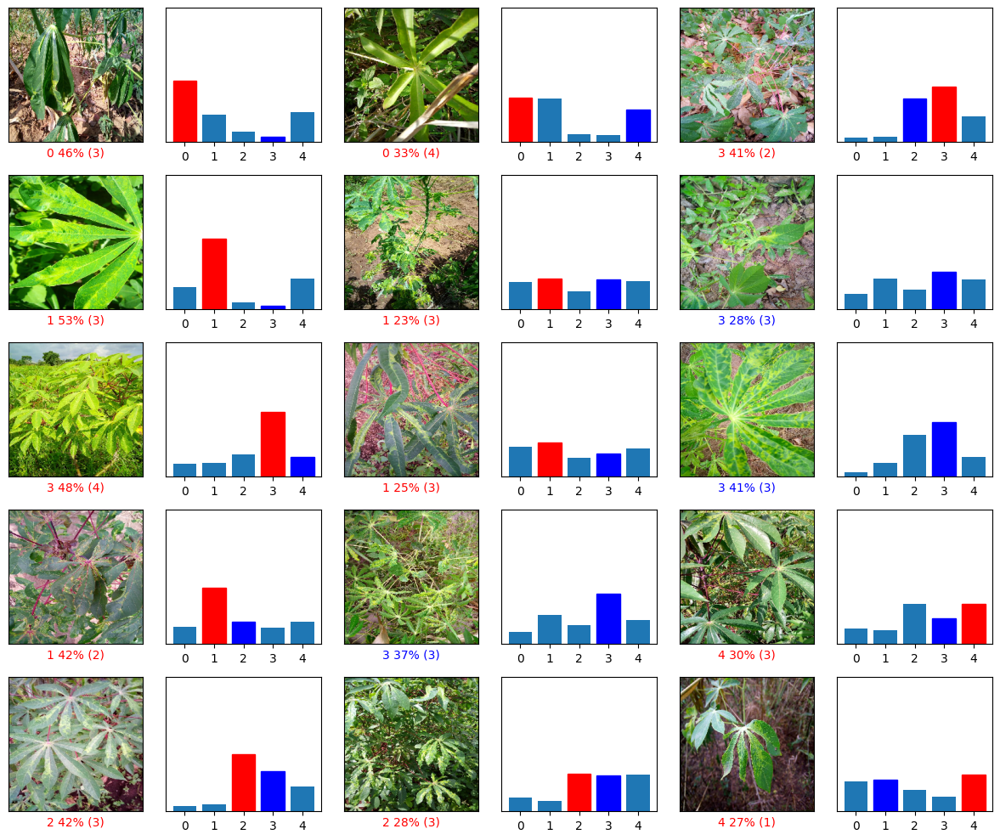

In [108]:
class_indices = train_generator.class_indices
class_names = {v: k for k, v in class_indices.items()}

NUM_CLASSES = len(class_names)

images, labels_batch = next(test_generator)
true_labels_batch = np.argmax(labels_batch, axis=1)

batch_pred_probs = model_pretrained.predict(images)

num_rows = 5
num_cols = 3
num_images = num_rows * num_cols

plt.figure(figsize=(2 * 2 * num_cols, 2 * num_rows))

for i in range(num_images):

    plt.subplot(num_rows, 2 * num_cols, 2 * i + 1)
    plot_image(i, batch_pred_probs[i], true_labels_batch, images)

    plt.subplot(num_rows, 2 * num_cols, 2 * i + 2)
    plot_value_array(i, batch_pred_probs[i], true_labels_batch)

plt.tight_layout()
plt.show()

In [109]:
test_generator.reset()

y_pred_probs = model_pretrained.predict(test_generator, verbose=1)
y_true = np.asarray(test_generator.classes)

class_indices = test_generator.class_indices
class_names = [class_name for class_name, class_id in sorted(class_indices.items(), key=lambda x: x[1])]

num_classes = y_pred_probs.shape[1]

macro_auc = roc_auc_score(y_true, y_pred_probs, multi_class="ovr", average="macro")

y_true_onehot = label_binarize(y_true, classes=np.arange(num_classes))

per_class_auc = roc_auc_score(y_true_onehot, y_pred_probs, average=None)

auc_df = pd.DataFrame({"class": class_names, "roc_auc": per_class_auc})

print(f"\nMacro ROC AUC: {macro_auc:.4f}\n")
print(auc_df)

45/45 ━━━━━━━━━━━━━━━━━━━━ 19s 404ms/step

Macro ROC AUC: 0.7560

  class   roc_auc
0     0  0.833646
1     1  0.815008
2     2  0.655826
3     3  0.820219
4     4  0.655506


In [110]:
roc_auc = {"Macro ROC AUC": macro_auc}

for class_name, auc_value in zip(class_names, per_class_auc):
    roc_auc[class_name] = auc_value

ROC_AUC.append(roc_auc)

ROC_AUC_pd = pd.DataFrame(ROC_AUC)

print(ROC_AUC_pd)

   Macro ROC AUC         0         1         2         3         4
0       0.922316  0.911712  0.938750  0.893596  0.961444  0.906079
1       0.847204  0.910270  0.840137  0.740425  0.896709  0.848480
2       0.756041  0.833646  0.815008  0.655826  0.820219  0.655506


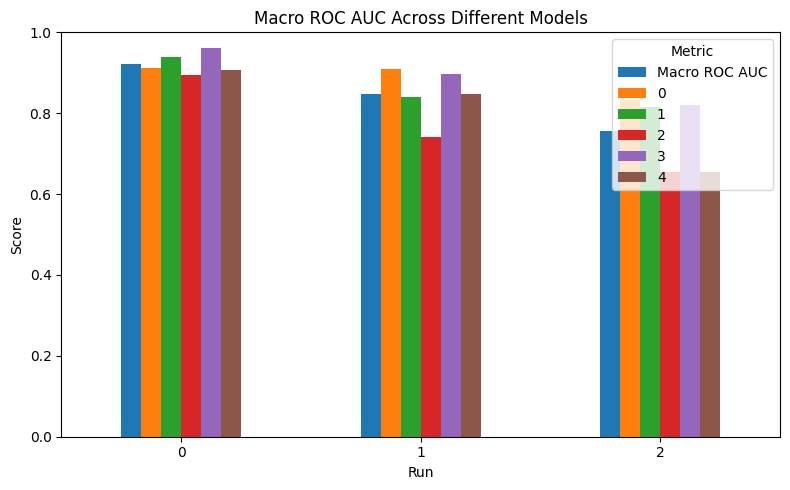

In [111]:
ROC_AUC_pd.plot(kind="bar", figsize=(8, 5))

plt.title("Macro ROC AUC Across Different Models")
plt.xlabel("Run")
plt.ylabel("Score")
plt.ylim(0, 1)
plt.xticks(rotation=0)
plt.legend(title="Metric")
plt.tight_layout()
plt.show()

## 4. Fine Tuning ConvNeXtTiny

### Training

In [112]:
# Unfreeze the base model
base_model.trainable = True

# Only fine-tune the last 20 layers, rest stayes frozen
for layer in base_model.layers[:-20]:
    layer.trainable = False

In [113]:
model_pretrained.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-5),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

In [114]:
mc = ModelCheckpoint('ConvNeXtTiny_finetun_model.keras', monitor='val_loss', mode='min', verbose=1, save_best_only=True)

In [115]:
%%time

history_4 = model_pretrained.fit(
    train_generator,
    validation_data=val_generator,
    epochs=EPOCHS_FINE,
    callbacks=[es, mc],
    verbose=1,
    class_weight=class_weight_dict
)

Epoch 1/100
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.5170 - loss: 1.3631
Epoch 1: val_loss improved from None to 1.35869, saving model to best_finetun_model.keras

Epoch 1: finished saving model to best_finetun_model.keras
134/134 ━━━━━━━━━━━━━━━━━━━━ 217s 2s/step - accuracy: 0.5078 - loss: 1.3798 - val_accuracy: 0.4584 - val_loss: 1.3587
Epoch 2/100
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.4950 - loss: 1.3687
Epoch 2: val_loss did not improve from 1.35869
134/134 ━━━━━━━━━━━━━━━━━━━━ 190s 1s/step - accuracy: 0.4981 - loss: 1.3676 - val_accuracy: 0.4418 - val_loss: 1.3738
Epoch 3/100
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.4928 - loss: 1.3849
Epoch 3: val_loss did not improve from 1.35869
134/134 ━━━━━━━━━━━━━━━━━━━━ 189s 1s/step - accuracy: 0.4898 - loss: 1.3633 - val_accuracy: 0.4332 - val_loss: 1.3815
Epoch 4/100
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.4772 - loss: 1.3909
Epoch 4: val_loss did not improve from 1.35869
134/134 ━━━

In [116]:
model_finetuned = keras.models.load_model('ConvNeXtTiny_finetun_model.keras')

### Evaluating

In [117]:
model_finetuned.evaluate(test_generator)

45/45 ━━━━━━━━━━━━━━━━━━━━ 27s 478ms/step - accuracy: 0.4643 - loss: 1.3518


[1.3517698049545288, 0.4642523229122162]

In [118]:
pred_probs = model_finetuned.predict(test_generator)

predictions = np.argmax(pred_probs, axis=1)

45/45 ━━━━━━━━━━━━━━━━━━━━ 26s 481ms/step


In [119]:
pred_labels = np.argmax(pred_probs, axis=1)
true_labels = test_generator.classes

In [120]:
metrics = {
    "Accuracy": accuracy_score(true_labels, predictions),
    "Precision": precision_score(true_labels, predictions, average="macro"),
    "Recall": recall_score(true_labels, predictions, average="macro"),
    "F1_Score": f1_score(true_labels, predictions, average="macro")
}

ErrorMetrics.append(metrics)

ErrorMetrics_pd = pd.DataFrame(ErrorMetrics)

print(ErrorMetrics_pd)

   Accuracy  Precision    Recall  F1_Score
0  0.773364   0.633636  0.629487  0.620552
1  0.606542   0.454073  0.527672  0.465028
2  0.488785   0.362103  0.427039  0.361729
3  0.464252   0.359884  0.433910  0.360546


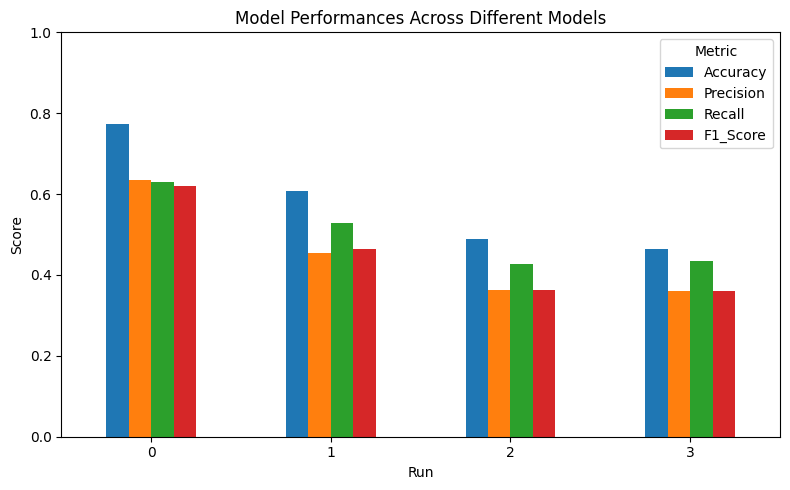

In [121]:
ErrorMetrics_pd.plot(kind="bar", figsize=(8, 5))

plt.title("Model Performances Across Different Models")
plt.xlabel("Run")
plt.ylabel("Score")
plt.ylim(0, 1)
plt.xticks(rotation=0)
plt.legend(title="Metric")
plt.tight_layout()
plt.show()

In [122]:
class_labels = list(test_generator.class_indices.keys())

print(classification_report(true_labels, pred_labels, target_names=class_labels))

              precision    recall  f1-score   support

           0       0.20      0.55      0.30       217
           1       0.26      0.53      0.35       438
           2       0.26      0.31      0.28       477
           3       0.88      0.51      0.65      2632
           4       0.20      0.26      0.22       516

    accuracy                           0.46      4280
   macro avg       0.36      0.43      0.36      4280
weighted avg       0.63      0.46      0.51      4280



In [123]:
cm = confusion_matrix(true_labels, pred_labels)
print(cm)

[[ 119   68    6    9   15]
 [ 114  234   16   22   52]
 [  33   90  149  101  104]
 [ 208  352  342 1350  380]
 [ 107  157   67   50  135]]


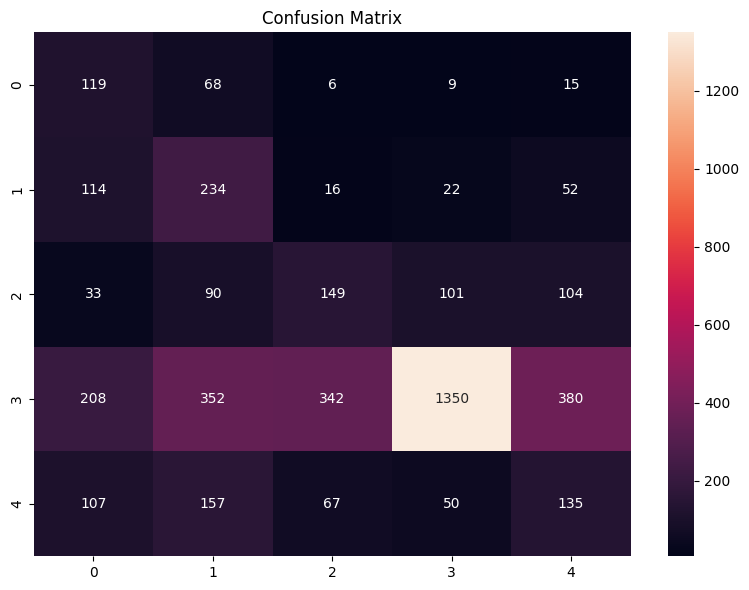

In [124]:
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=class_labels, yticklabels=class_labels, cbar=True)
plt.title("Confusion Matrix")
plt.tight_layout()
plt.show()

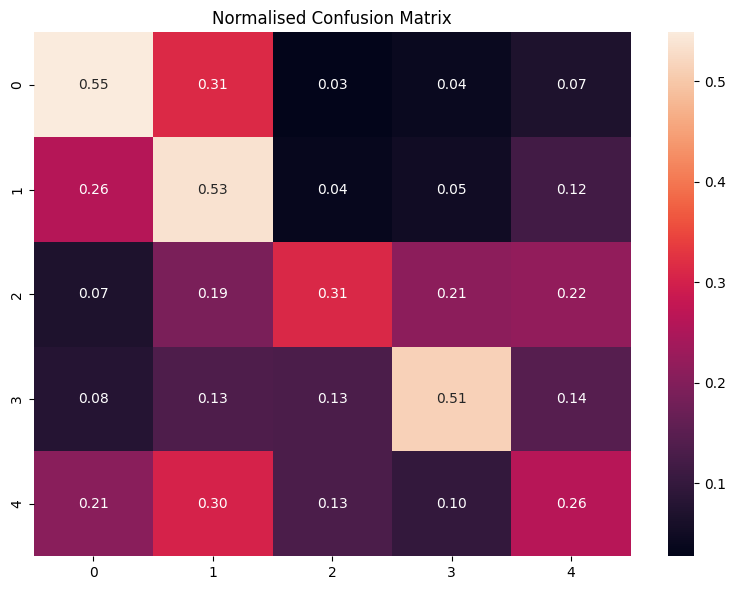

In [125]:
cm_normalised = cm.astype('float') / cm.sum(axis=1, keepdims=True)

plt.figure(figsize=(8,6))
sns.heatmap(cm_normalised, annot=True, fmt='.2f', xticklabels=class_labels, yticklabels=class_labels, cbar=True)
plt.title("Normalised Confusion Matrix")
plt.tight_layout()
plt.show()

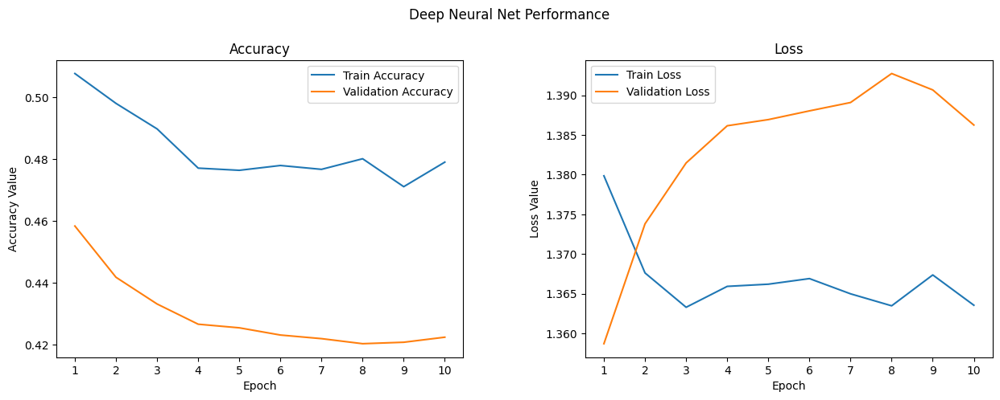

In [126]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
t = f.suptitle('Deep Neural Net Performance', fontsize=12)
f.subplots_adjust(top=0.85, wspace=0.3)

epochs = list(range(1,10+1))
ax1.plot(epochs, history_4.history['accuracy'], label='Train Accuracy')
ax1.plot(epochs, history_4.history['val_accuracy'], label='Validation Accuracy')
ax1.set_xticks(epochs)
ax1.set_ylabel('Accuracy Value')
ax1.set_xlabel('Epoch')
ax1.set_title('Accuracy')
l1 = ax1.legend(loc="best")

ax2.plot(epochs, history_4.history['loss'], label='Train Loss')
ax2.plot(epochs, history_4.history['val_loss'], label='Validation Loss')
ax2.set_xticks(epochs)
ax2.set_ylabel('Loss Value')
ax2.set_xlabel('Epoch')
ax2.set_title('Loss')
l2 = ax2.legend(loc="best")

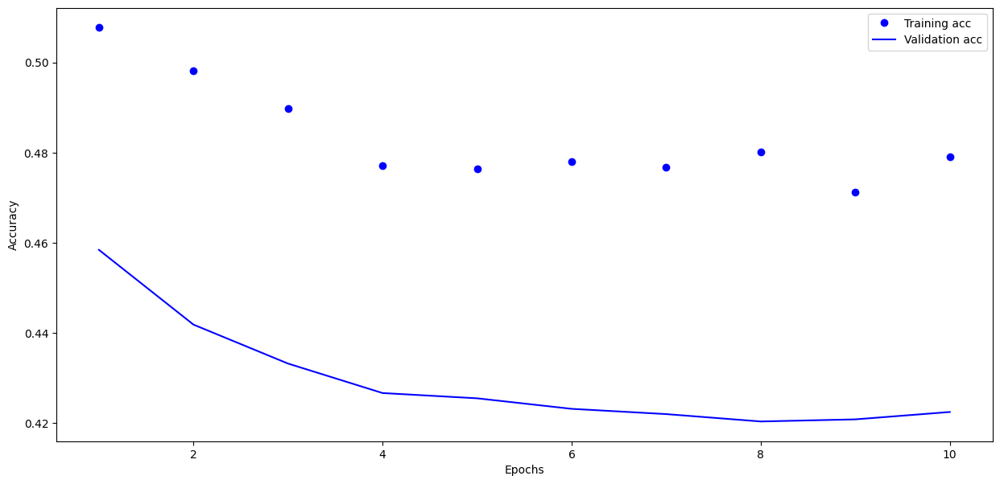

In [127]:
history_dict = history_4.history

acc_values = history_dict['accuracy']
val_acc_values = history_dict['val_accuracy']
epochs = range(1, len(acc_values) + 1)

plt.figure(num=1, figsize=(15,7))
plt.plot(epochs, acc_values, 'bo', label='Training acc')
plt.plot(epochs, val_acc_values, 'b', label='Validation acc')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.show()

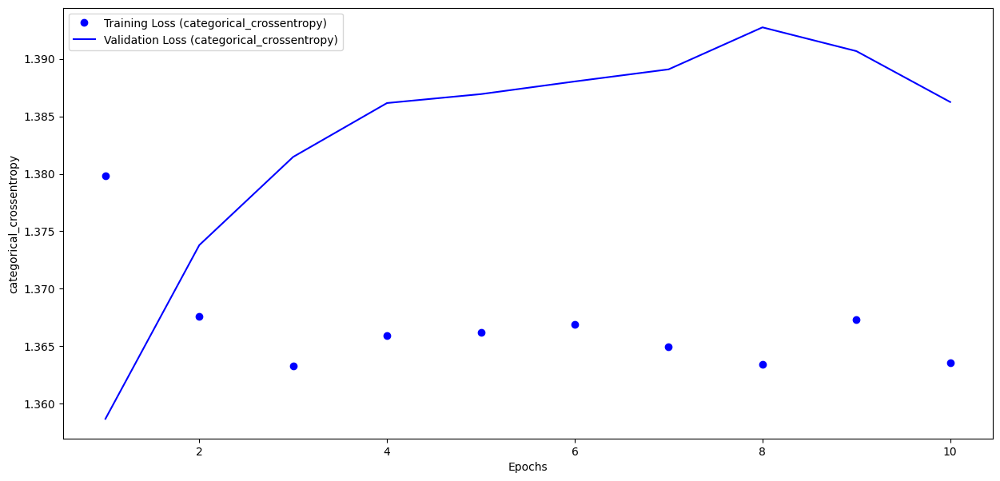

In [128]:
history_dict = history_4.history

acc_values = history_dict['loss']
val_acc_values = history_dict['val_loss']
epochs = range(1, len(acc_values) + 1)

plt.figure(num=1, figsize=(15, 7))
plt.plot(epochs, acc_values, 'bo', label='Training Loss (categorical_crossentropy)')
plt.plot(epochs, val_acc_values, 'b', label='Validation Loss (categorical_crossentropy)')
plt.xlabel('Epochs')
plt.ylabel('categorical_crossentropy')
plt.legend()

plt.show()

3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step


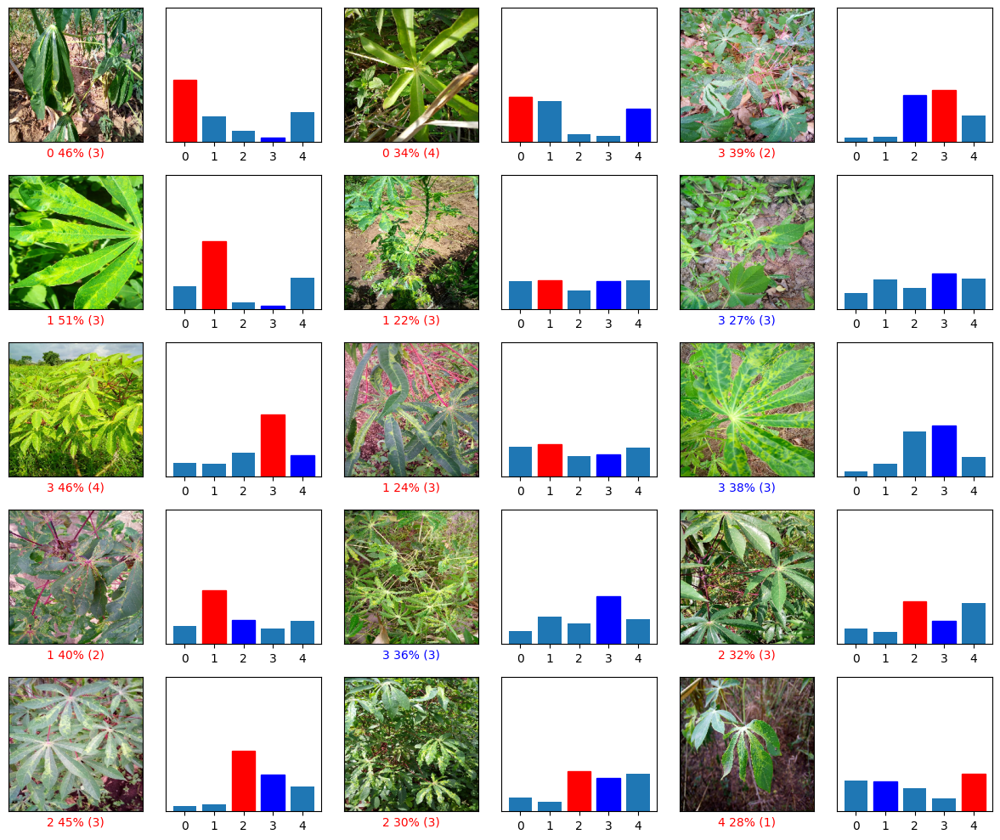

In [129]:
class_indices = train_generator.class_indices
class_names = {v: k for k, v in class_indices.items()}

NUM_CLASSES = len(class_names)

images, labels_batch = next(test_generator)
true_labels_batch = np.argmax(labels_batch, axis=1)

batch_pred_probs = model_finetuned.predict(images)

num_rows = 5
num_cols = 3
num_images = num_rows * num_cols

plt.figure(figsize=(2 * 2 * num_cols, 2 * num_rows))

for i in range(num_images):

    plt.subplot(num_rows, 2 * num_cols, 2 * i + 1)
    plot_image(i, batch_pred_probs[i], true_labels_batch, images)

    plt.subplot(num_rows, 2 * num_cols, 2 * i + 2)
    plot_value_array(i, batch_pred_probs[i], true_labels_batch)

plt.tight_layout()
plt.show()

In [130]:
test_generator.reset()

y_pred_probs = model_finetuned.predict(test_generator, verbose=1)
y_true = np.asarray(test_generator.classes)

class_indices = test_generator.class_indices
class_names = [class_name for class_name, class_id in sorted(class_indices.items(), key=lambda x: x[1])]

num_classes = y_pred_probs.shape[1]

macro_auc = roc_auc_score(y_true, y_pred_probs, multi_class="ovr", average="macro")

y_true_onehot = label_binarize(y_true, classes=np.arange(num_classes))

per_class_auc = roc_auc_score(y_true_onehot, y_pred_probs, average=None)

auc_df = pd.DataFrame({"class": class_names, "roc_auc": per_class_auc})

print(f"\nMacro ROC AUC: {macro_auc:.4f}\n")
print(auc_df)

45/45 ━━━━━━━━━━━━━━━━━━━━ 18s 393ms/step

Macro ROC AUC: 0.7553

  class   roc_auc
0     0  0.833953
1     1  0.814211
2     2  0.652882
3     3  0.820961
4     4  0.654425


In [131]:
roc_auc = {"Macro ROC AUC": macro_auc}

for class_name, auc_value in zip(class_names, per_class_auc):
    roc_auc[class_name] = auc_value

ROC_AUC.append(roc_auc)

ROC_AUC_pd = pd.DataFrame(ROC_AUC)

print(ROC_AUC_pd)

   Macro ROC AUC         0         1         2         3         4
0       0.922316  0.911712  0.938750  0.893596  0.961444  0.906079
1       0.847204  0.910270  0.840137  0.740425  0.896709  0.848480
2       0.756041  0.833646  0.815008  0.655826  0.820219  0.655506
3       0.755286  0.833953  0.814211  0.652882  0.820961  0.654425


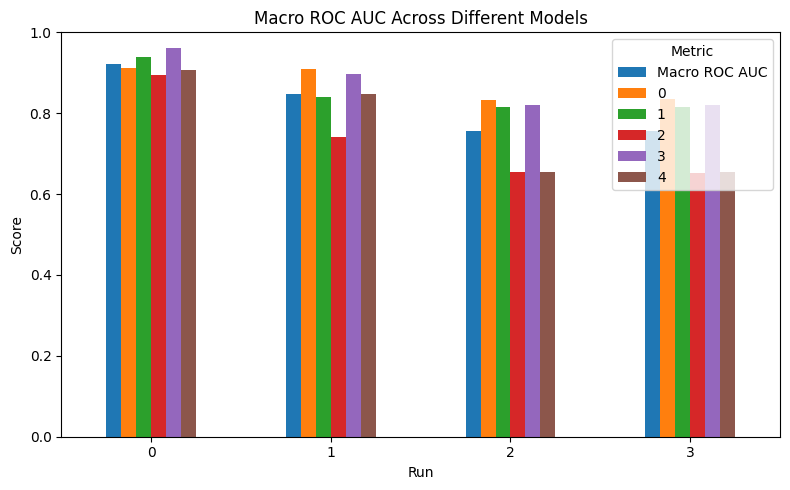

In [132]:
ROC_AUC_pd.plot(kind="bar", figsize=(8, 5))

plt.title("Macro ROC AUC Across Different Models")
plt.xlabel("Run")
plt.ylabel("Score")
plt.ylim(0, 1)
plt.xticks(rotation=0)
plt.legend(title="Metric")
plt.tight_layout()
plt.show()

# ConvNeXtSmall

## 5. Pretrained ConvNeXtSmall

### Training

In [133]:
base_model = keras.applications.ConvNeXtSmall(include_top=False, weights="imagenet", input_shape=(IMG_SIZE, IMG_SIZE, 3), pooling="avg")

base_model.trainable = False

198551472/198551472 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [134]:
base_model.summary()

Model: "convnext_small"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_7       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_small_pre… │ (None, 224, 224,  │          0 │ input_layer_7[0]… │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_small_stem │ (None, 56, 56,    │      4,896 │ convnext_small_p… │
│ (Sequential)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_small_sta… │ (None, 56, 56,    │      4,800 │ convnext_small_s… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_small_sta… │ (None, 56, 56,    │        192 │ convnext_small_s… │
│ (LayerNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_small_sta… │ (None, 56, 56,    │     37,248 │ convnext_small_s… │
│ (Dense)             │ 384)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_small_sta… │ (None, 56, 56,    │          0 │ convnext_small_s… │
│ (Activation)        │ 384)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_small_sta… │ (None, 56, 56,    │     36,960 │ convnext_small_s… │
│ (Dense)             │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_small_sta… │ (None, 56, 56,    │         96 │ convnext_small_s… │
│ (LayerScale)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_small_sta… │ (None, 56, 56,    │          0 │ convnext_small_s… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_18 (Add)        │ (None, 56, 56,    │          0 │ convnext_small_s… │
│                     │ 96)               │            │ convnext_small_s… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_small_sta… │ (None, 56, 56,    │      4,800 │ add_18[0][0]      │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_small_sta… │ (None, 56, 56,    │        192 │ convnext_small_s… │
│ (LayerNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_small_sta… │ (None, 56, 56,    │     37,248 │ convnext_small_s… │
│ (Dense)             │ 384)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_small_sta… │ (None, 56, 56,    │          0 │ convnext_small_s… │
│ (Activation)        │ 384)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_small_sta… │ (None, 56, 56,    │     36,960 │ convnext_small_s… │
│ (Dense)             │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_small_sta… │ (None, 56, 56,    │         96 │ convnext_small_s

 Total params: 49,454,688 (188.65 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 49,454,688 (188.65 MB)

In [135]:
inputs = keras.Input(shape=(IMG_SIZE, IMG_SIZE, 3))

x = base_model(inputs, training=False)

x = layers.Dropout(0.4)(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)

model_pretrained = keras.Model(inputs, outputs)

In [136]:
model_pretrained.summary()
# model_pretrained.summary(expand_nested=True) # to inspect full model

Model: "functional_61"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_12 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_small (Functional)     │ (None, 768)            │    49,454,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 768)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 5)              │         3,845 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 49,458,533 (188.67 MB)

 Trainable params: 3,845 (15.02 KB)

 Non-trainable params: 49,454,688 (188.65 MB)

In [137]:
model_pretrained.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [138]:
mc = ModelCheckpoint('ConvNeXtSmall_pretra_model.keras', monitor='val_loss', mode='min', verbose=1, save_best_only=True)

In [139]:
%%time

history_5 = model_pretrained.fit(
    train_generator,
    validation_data=val_generator,
    epochs=EPOCHS_HEAD,
    callbacks=[es, mc],
    verbose=1 ,
    class_weight=class_weight_dict
)

Epoch 1/100
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.2010 - loss: 1.9326
Epoch 1: val_loss improved from None to 1.61255, saving model to ConvNeXtSmall_pretra_model.keras

Epoch 1: finished saving model to ConvNeXtSmall_pretra_model.keras
134/134 ━━━━━━━━━━━━━━━━━━━━ 250s 2s/step - accuracy: 0.1877 - loss: 1.7833 - val_accuracy: 0.1393 - val_loss: 1.6125
Epoch 2/100
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.2165 - loss: 1.6072
Epoch 2: val_loss improved from 1.61255 to 1.59065, saving model to ConvNeXtSmall_pretra_model.keras

Epoch 2: finished saving model to ConvNeXtSmall_pretra_model.keras
134/134 ━━━━━━━━━━━━━━━━━━━━ 212s 2s/step - accuracy: 0.2255 - loss: 1.6197 - val_accuracy: 0.1199 - val_loss: 1.5907
Epoch 3/100
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.2638 - loss: 1.5953
Epoch 3: val_loss improved from 1.59065 to 1.54098, saving model to ConvNeXtSmall_pretra_model.keras

Epoch 3: finished saving model to ConvNeXtSmall_pretra_model.keras
13

In [140]:
model_pretrained=keras.models.load_model('ConvNeXtSmall_pretra_model.keras')

### Evaluating

In [141]:
model_pretrained.evaluate(test_generator)

45/45 ━━━━━━━━━━━━━━━━━━━━ 41s 729ms/step - accuracy: 0.4692 - loss: 1.4152


[1.4152185916900635, 0.4691588878631592]

In [142]:
pred_probs = model_pretrained.predict(test_generator)

predictions = np.argmax(pred_probs, axis=1)

45/45 ━━━━━━━━━━━━━━━━━━━━ 42s 792ms/step


In [143]:
pred_labels = np.argmax(pred_probs, axis=1)
true_labels = test_generator.classes

In [144]:
metrics = {
    "Accuracy": accuracy_score(true_labels, predictions),
    "Precision": precision_score(true_labels, predictions, average="macro"),
    "Recall": recall_score(true_labels, predictions, average="macro"),
    "F1_Score": f1_score(true_labels, predictions, average="macro")
}

ErrorMetrics.append(metrics)

ErrorMetrics_pd = pd.DataFrame(ErrorMetrics)

print(ErrorMetrics_pd)

   Accuracy  Precision    Recall  F1_Score
0  0.773364   0.633636  0.629487  0.620552
1  0.606542   0.454073  0.527672  0.465028
2  0.488785   0.362103  0.427039  0.361729
3  0.464252   0.359884  0.433910  0.360546
4  0.469159   0.324245  0.318956  0.267922


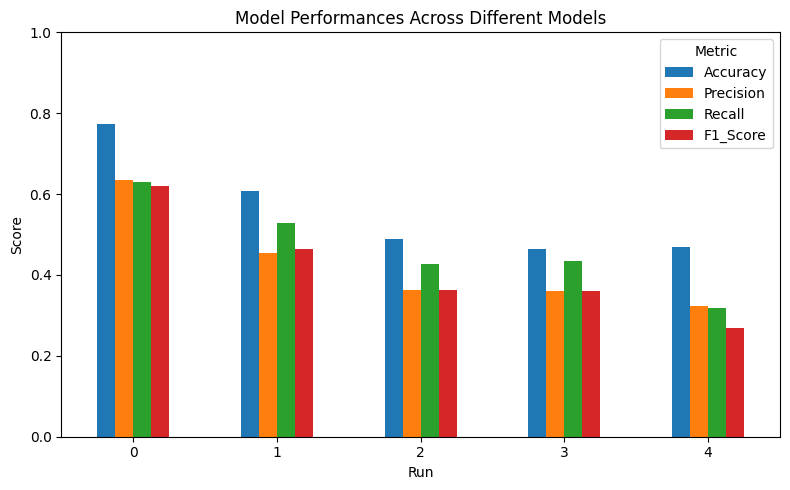

In [145]:
ErrorMetrics_pd.plot(kind="bar", figsize=(8, 5))

plt.title("Model Performances Across Different Models")
plt.xlabel("Run")
plt.ylabel("Score")
plt.ylim(0, 1)
plt.xticks(rotation=0)
plt.legend(title="Metric")
plt.tight_layout()
plt.show()

In [146]:
class_labels = list(test_generator.class_indices.keys())

print(classification_report(true_labels, pred_labels, target_names=class_labels))

              precision    recall  f1-score   support

           0       0.15      0.37      0.22       217
           1       0.32      0.14      0.20       438
           2       0.17      0.45      0.25       477
           3       0.73      0.63      0.67      2632
           4       0.25      0.00      0.01       516

    accuracy                           0.47      4280
   macro avg       0.32      0.32      0.27      4280
weighted avg       0.54      0.47      0.47      4280



In [147]:
cm = confusion_matrix(true_labels, pred_labels)
print(cm)

[[  80   19   44   74    0]
 [ 104   62  113  155    4]
 [  44   13  217  203    0]
 [ 181   55  747 1647    2]
 [ 108   43  173  190    2]]


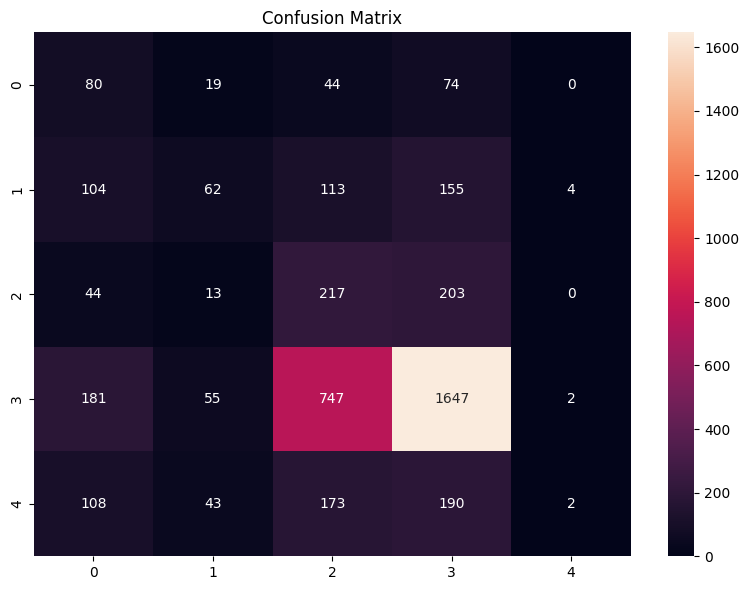

In [148]:
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=class_labels, yticklabels=class_labels, cbar=True)
plt.title("Confusion Matrix")
plt.tight_layout()
plt.show()

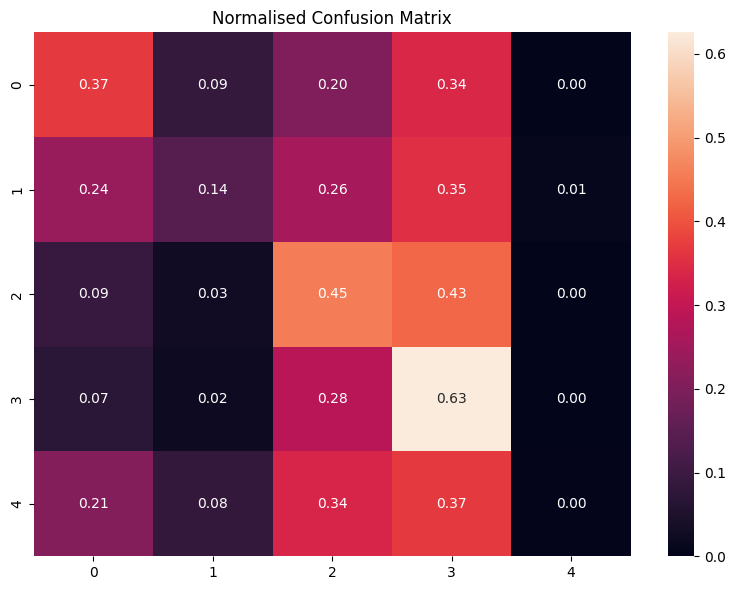

In [149]:
cm_normalised = cm.astype('float') / cm.sum(axis=1, keepdims=True)

plt.figure(figsize=(8,6))
sns.heatmap(cm_normalised, annot=True, fmt='.2f', xticklabels=class_labels, yticklabels=class_labels, cbar=True)
plt.title("Normalised Confusion Matrix")
plt.tight_layout()
plt.show()

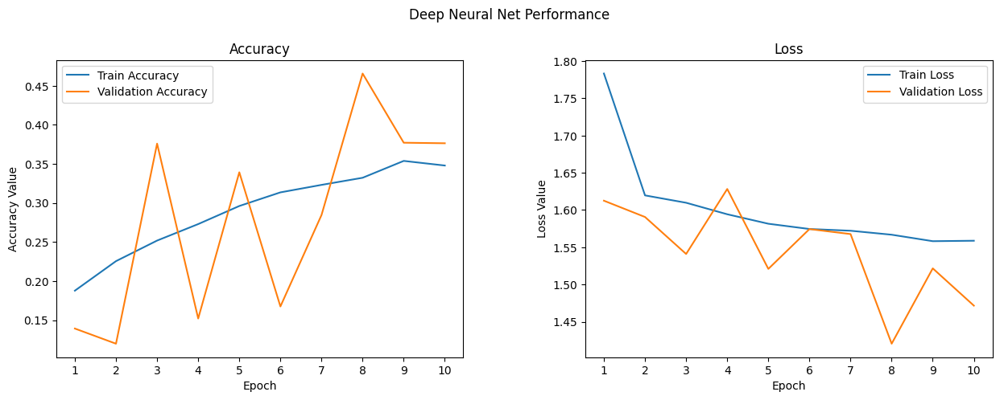

In [150]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
t = f.suptitle('Deep Neural Net Performance', fontsize=12)
f.subplots_adjust(top=0.85, wspace=0.3)

epochs = list(range(1,10+1))
ax1.plot(epochs, history_5.history['accuracy'], label='Train Accuracy')
ax1.plot(epochs, history_5.history['val_accuracy'], label='Validation Accuracy')
ax1.set_xticks(epochs)
ax1.set_ylabel('Accuracy Value')
ax1.set_xlabel('Epoch')
ax1.set_title('Accuracy')
l1 = ax1.legend(loc="best")

ax2.plot(epochs, history_5.history['loss'], label='Train Loss')
ax2.plot(epochs, history_5.history['val_loss'], label='Validation Loss')
ax2.set_xticks(epochs)
ax2.set_ylabel('Loss Value')
ax2.set_xlabel('Epoch')
ax2.set_title('Loss')
l2 = ax2.legend(loc="best")

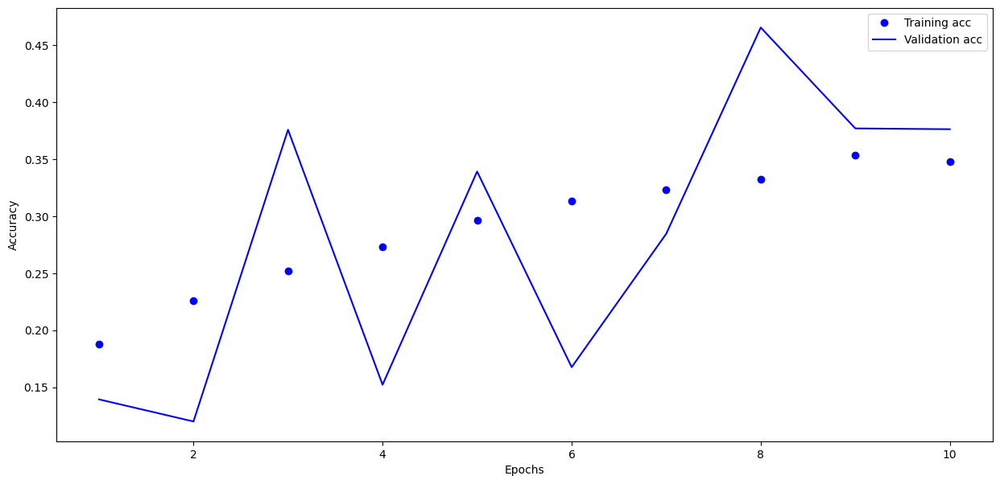

In [151]:
history_dict = history_5.history

acc_values = history_dict['accuracy']
val_acc_values = history_dict['val_accuracy']
epochs = range(1, len(acc_values) + 1)

plt.figure(num=1, figsize=(15,7))
plt.plot(epochs, acc_values, 'bo', label='Training acc')
plt.plot(epochs, val_acc_values, 'b', label='Validation acc')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.show()

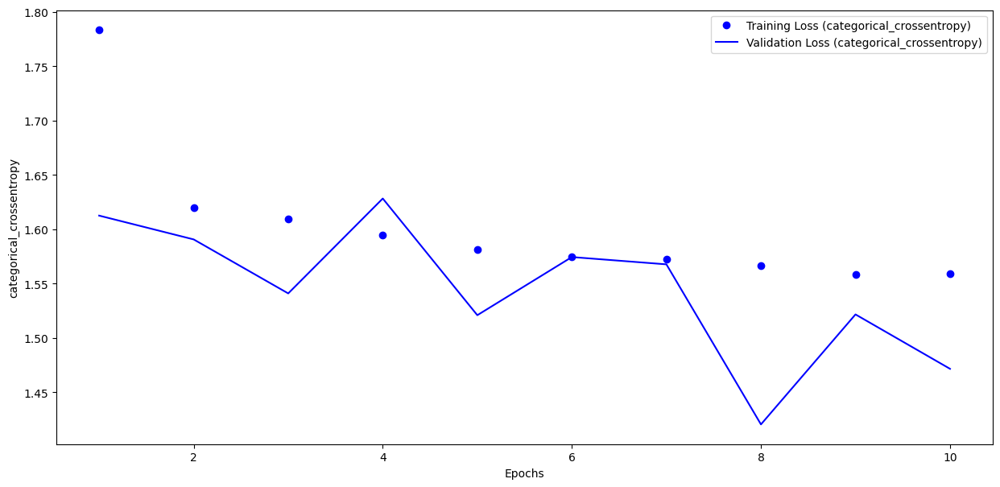

In [152]:
history_dict = history_5.history

acc_values = history_dict['loss']
val_acc_values = history_dict['val_loss']
epochs = range(1, len(acc_values) + 1)

plt.figure(num=1, figsize=(15, 7))
plt.plot(epochs, acc_values, 'bo', label='Training Loss (categorical_crossentropy)')
plt.plot(epochs, val_acc_values, 'b', label='Validation Loss (categorical_crossentropy)')
plt.xlabel('Epochs')
plt.ylabel('categorical_crossentropy')
plt.legend()

plt.show()

3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 212ms/step


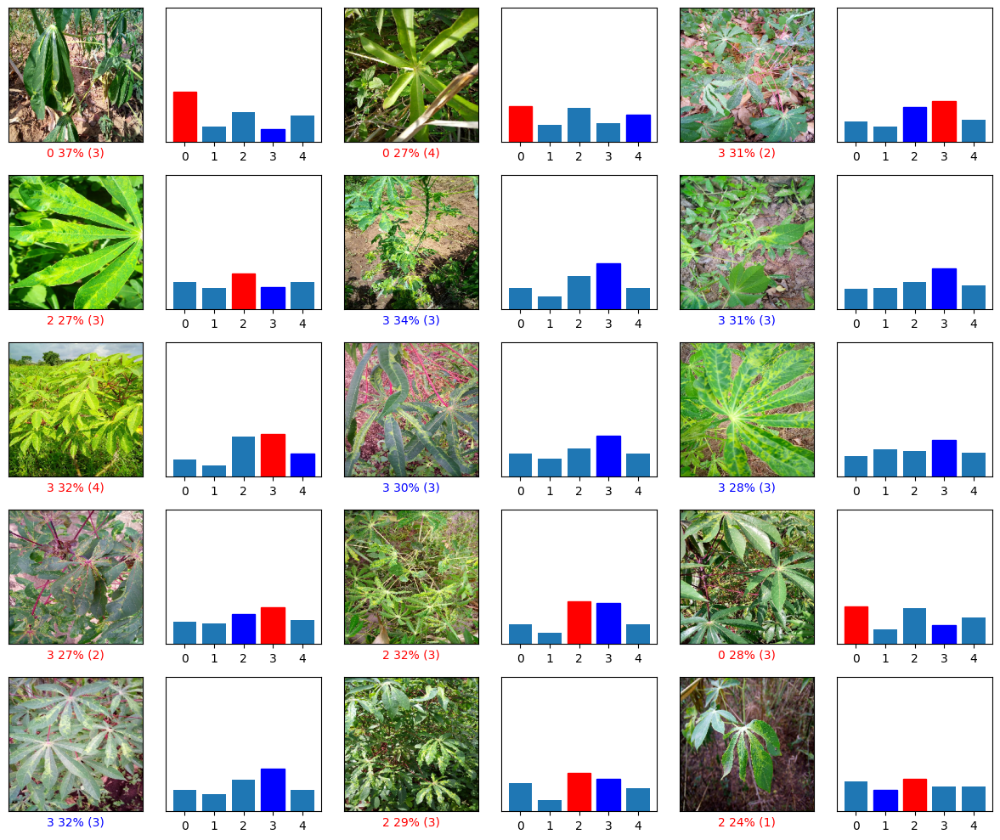

In [153]:
class_indices = train_generator.class_indices
class_names = {v: k for k, v in class_indices.items()}

NUM_CLASSES = len(class_names)

images, labels_batch = next(test_generator)
true_labels_batch = np.argmax(labels_batch, axis=1)

batch_pred_probs = model_pretrained.predict(images)

num_rows = 5
num_cols = 3
num_images = num_rows * num_cols

plt.figure(figsize=(2 * 2 * num_cols, 2 * num_rows))

for i in range(num_images):

    plt.subplot(num_rows, 2 * num_cols, 2 * i + 1)
    plot_image(i, batch_pred_probs[i], true_labels_batch, images)

    plt.subplot(num_rows, 2 * num_cols, 2 * i + 2)
    plot_value_array(i, batch_pred_probs[i], true_labels_batch)

plt.tight_layout()
plt.show()

In [154]:
test_generator.reset()

y_pred_probs = model_pretrained.predict(test_generator, verbose=1)
y_true = np.asarray(test_generator.classes)

class_indices = test_generator.class_indices
class_names = [class_name for class_name, class_id in sorted(class_indices.items(), key=lambda x: x[1])]

num_classes = y_pred_probs.shape[1]

macro_auc = roc_auc_score(y_true, y_pred_probs, multi_class="ovr", average="macro")

y_true_onehot = label_binarize(y_true, classes=np.arange(num_classes))

per_class_auc = roc_auc_score(y_true_onehot, y_pred_probs, average=None)

auc_df = pd.DataFrame({"class": class_names, "roc_auc": per_class_auc})

print(f"\nMacro ROC AUC: {macro_auc:.4f}\n")
print(auc_df)

45/45 ━━━━━━━━━━━━━━━━━━━━ 27s 589ms/step

Macro ROC AUC: 0.6909

  class   roc_auc
0     0  0.729812
1     1  0.735939
2     2  0.616270
3     3  0.709491
4     4  0.662941


In [155]:
roc_auc = {"Macro ROC AUC": macro_auc}

for class_name, auc_value in zip(class_names, per_class_auc):
    roc_auc[class_name] = auc_value

ROC_AUC.append(roc_auc)

ROC_AUC_pd = pd.DataFrame(ROC_AUC)

print(ROC_AUC_pd)

   Macro ROC AUC         0         1         2         3         4
0       0.922316  0.911712  0.938750  0.893596  0.961444  0.906079
1       0.847204  0.910270  0.840137  0.740425  0.896709  0.848480
2       0.756041  0.833646  0.815008  0.655826  0.820219  0.655506
3       0.755286  0.833953  0.814211  0.652882  0.820961  0.654425
4       0.690891  0.729812  0.735939  0.616270  0.709491  0.662941


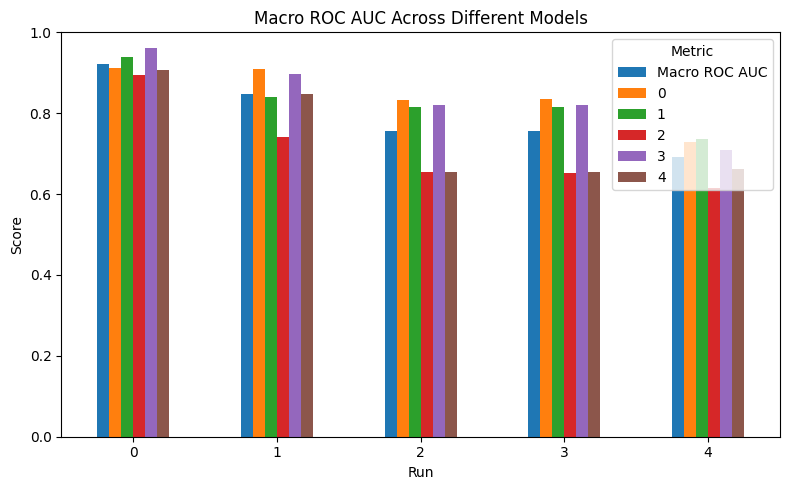

In [156]:
ROC_AUC_pd.plot(kind="bar", figsize=(8, 5))

plt.title("Macro ROC AUC Across Different Models")
plt.xlabel("Run")
plt.ylabel("Score")
plt.ylim(0, 1)
plt.xticks(rotation=0)
plt.legend(title="Metric")
plt.tight_layout()
plt.show()

## 6. Fine Tuning ConvNeXtSmall

### Training

In [157]:
# Unfreeze the base model
base_model.trainable = True

# Only fine-tune the last 20 layers, rest stayes frozen
for layer in base_model.layers[:-20]:
    layer.trainable = False

In [158]:
model_pretrained.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-5),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

In [159]:
mc = ModelCheckpoint('ConvNeXtSmall_finetun_model.keras', monitor='val_loss', mode='min', verbose=1, save_best_only=True)

In [160]:
%%time

history_6 = model_pretrained.fit(
    train_generator,
    validation_data=val_generator,
    epochs=EPOCHS_FINE,
    callbacks=[es, mc],
    verbose=1,
    class_weight=class_weight_dict
)

Epoch 1/100
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.4652 - loss: 1.5838
Epoch 1: val_loss improved from None to 1.46400, saving model to best_finetun_model.keras

Epoch 1: finished saving model to best_finetun_model.keras
134/134 ━━━━━━━━━━━━━━━━━━━━ 245s 2s/step - accuracy: 0.4547 - loss: 1.5612 - val_accuracy: 0.4217 - val_loss: 1.4640
Epoch 2/100
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.4136 - loss: 1.5728
Epoch 2: val_loss did not improve from 1.46400
134/134 ━━━━━━━━━━━━━━━━━━━━ 208s 2s/step - accuracy: 0.4086 - loss: 1.5588 - val_accuracy: 0.3942 - val_loss: 1.4870
Epoch 3/100
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.4020 - loss: 1.5711
Epoch 3: val_loss did not improve from 1.46400
134/134 ━━━━━━━━━━━━━━━━━━━━ 207s 2s/step - accuracy: 0.3965 - loss: 1.5530 - val_accuracy: 0.3843 - val_loss: 1.4972
Epoch 4/100
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.3876 - loss: 1.5454
Epoch 4: val_loss did not improve from 1.46400
134/134 ━━━

In [161]:
model_finetuned = keras.models.load_model('ConvNeXtSmall_finetun_model.keras')

### Evaluating

In [162]:
model_finetuned.evaluate(test_generator)

45/45 ━━━━━━━━━━━━━━━━━━━━ 42s 754ms/step - accuracy: 0.4224 - loss: 1.4587


[1.4586650133132935, 0.4224299192428589]

In [163]:
pred_probs = model_finetuned.predict(test_generator)

predictions = np.argmax(pred_probs, axis=1)

45/45 ━━━━━━━━━━━━━━━━━━━━ 44s 818ms/step


In [164]:
pred_labels = np.argmax(pred_probs, axis=1)
true_labels = test_generator.classes

In [165]:
metrics = {
    "Accuracy": accuracy_score(true_labels, predictions),
    "Precision": precision_score(true_labels, predictions, average="macro"),
    "Recall": recall_score(true_labels, predictions, average="macro"),
    "F1_Score": f1_score(true_labels, predictions, average="macro")
}

ErrorMetrics.append(metrics)

ErrorMetrics_pd = pd.DataFrame(ErrorMetrics)

print(ErrorMetrics_pd)

   Accuracy  Precision    Recall  F1_Score
0  0.773364   0.633636  0.629487  0.620552
1  0.606542   0.454073  0.527672  0.465028
2  0.488785   0.362103  0.427039  0.361729
3  0.464252   0.359884  0.433910  0.360546
4  0.469159   0.324245  0.318956  0.267922
5  0.422430   0.326849  0.330483  0.266478


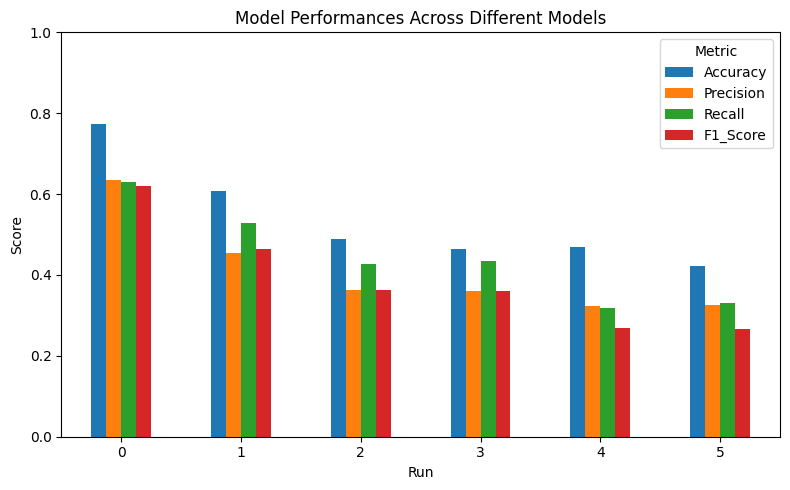

In [166]:
ErrorMetrics_pd.plot(kind="bar", figsize=(8, 5))

plt.title("Model Performances Across Different Models")
plt.xlabel("Run")
plt.ylabel("Score")
plt.ylim(0, 1)
plt.xticks(rotation=0)
plt.legend(title="Metric")
plt.tight_layout()
plt.show()

In [167]:
class_labels = list(test_generator.class_indices.keys())

print(classification_report(true_labels, pred_labels, target_names=class_labels))

              precision    recall  f1-score   support

           0       0.15      0.43      0.22       217
           1       0.29      0.19      0.23       438
           2       0.16      0.49      0.24       477
           3       0.75      0.53      0.62      2632
           4       0.29      0.01      0.03       516

    accuracy                           0.42      4280
   macro avg       0.33      0.33      0.27      4280
weighted avg       0.55      0.42      0.45      4280



In [168]:
cm = confusion_matrix(true_labels, pred_labels)
print(cm)

[[  93   24   48   50    2]
 [ 121   83  109  117    8]
 [  59   24  235  159    0]
 [ 237   94  904 1390    7]
 [ 131   61  173  144    7]]


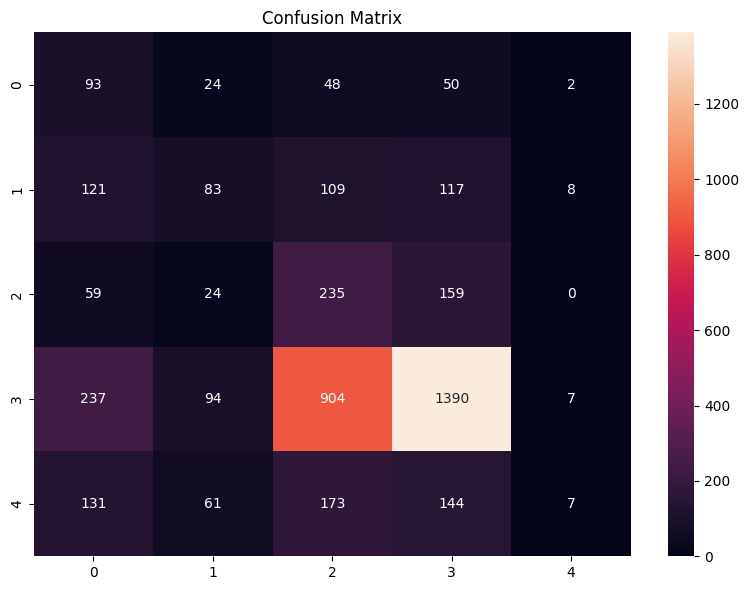

In [169]:
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=class_labels, yticklabels=class_labels, cbar=True)
plt.title("Confusion Matrix")
plt.tight_layout()
plt.show()

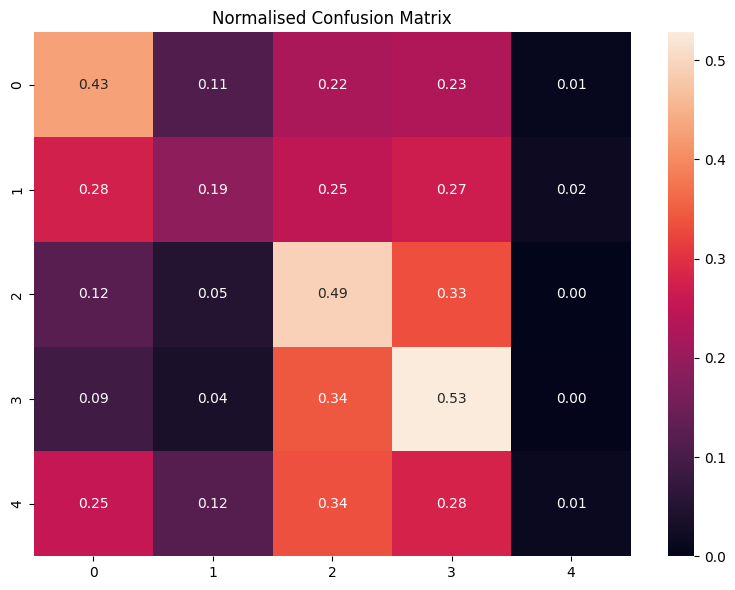

In [170]:
cm_normalised = cm.astype('float') / cm.sum(axis=1, keepdims=True)

plt.figure(figsize=(8,6))
sns.heatmap(cm_normalised, annot=True, fmt='.2f', xticklabels=class_labels, yticklabels=class_labels, cbar=True)
plt.title("Normalised Confusion Matrix")
plt.tight_layout()
plt.show()

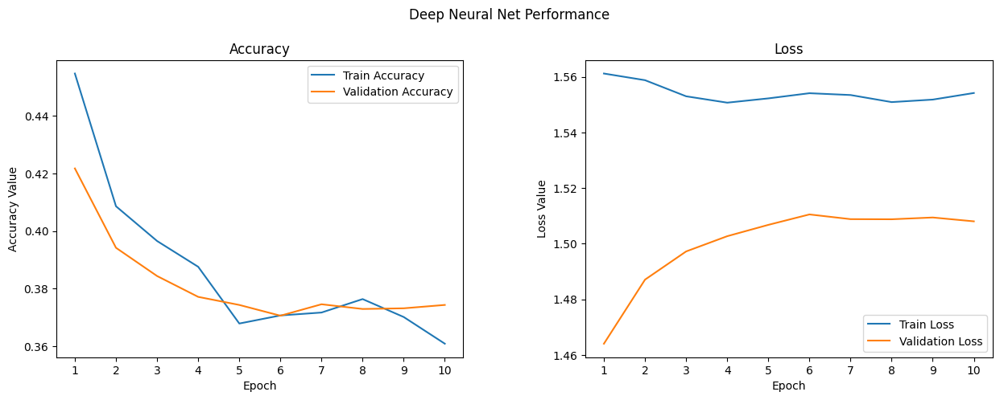

In [172]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
t = f.suptitle('Deep Neural Net Performance', fontsize=12)
f.subplots_adjust(top=0.85, wspace=0.3)

epochs = list(range(1,10+1))
ax1.plot(epochs, history_6.history['accuracy'], label='Train Accuracy')
ax1.plot(epochs, history_6.history['val_accuracy'], label='Validation Accuracy')
ax1.set_xticks(epochs)
ax1.set_ylabel('Accuracy Value')
ax1.set_xlabel('Epoch')
ax1.set_title('Accuracy')
l1 = ax1.legend(loc="best")

ax2.plot(epochs, history_6.history['loss'], label='Train Loss')
ax2.plot(epochs, history_6.history['val_loss'], label='Validation Loss')
ax2.set_xticks(epochs)
ax2.set_ylabel('Loss Value')
ax2.set_xlabel('Epoch')
ax2.set_title('Loss')
l2 = ax2.legend(loc="best")

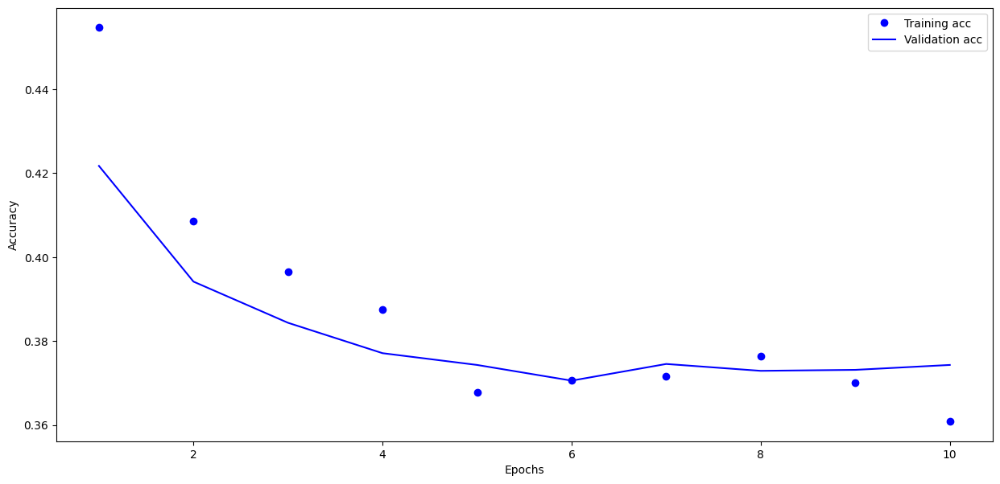

In [173]:
history_dict = history_6.history

acc_values = history_dict['accuracy']
val_acc_values = history_dict['val_accuracy']
epochs = range(1, len(acc_values) + 1)

plt.figure(num=1, figsize=(15,7))
plt.plot(epochs, acc_values, 'bo', label='Training acc')
plt.plot(epochs, val_acc_values, 'b', label='Validation acc')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.show()

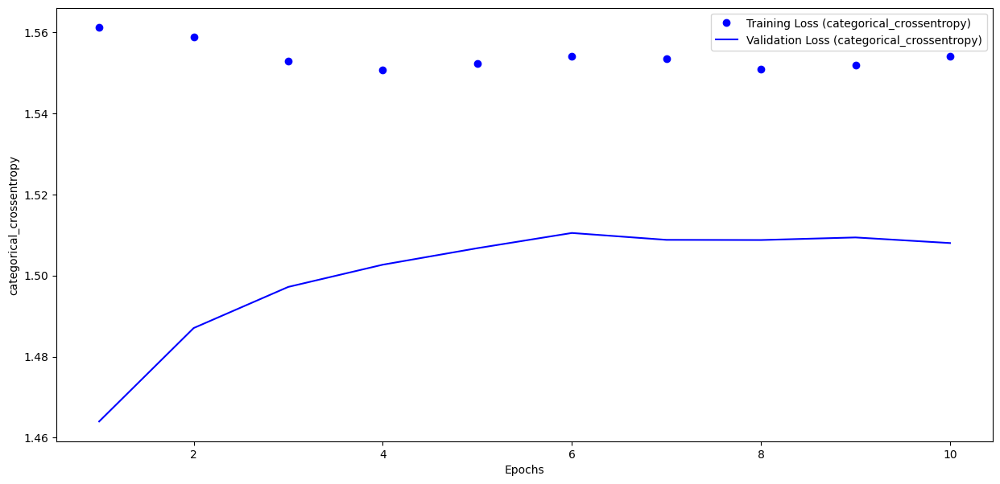

In [174]:
history_dict = history_6.history

acc_values = history_dict['loss']
val_acc_values = history_dict['val_loss']
epochs = range(1, len(acc_values) + 1)

plt.figure(num=1, figsize=(15, 7))
plt.plot(epochs, acc_values, 'bo', label='Training Loss (categorical_crossentropy)')
plt.plot(epochs, val_acc_values, 'b', label='Validation Loss (categorical_crossentropy)')
plt.xlabel('Epochs')
plt.ylabel('categorical_crossentropy')
plt.legend()

plt.show()

3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 225ms/step


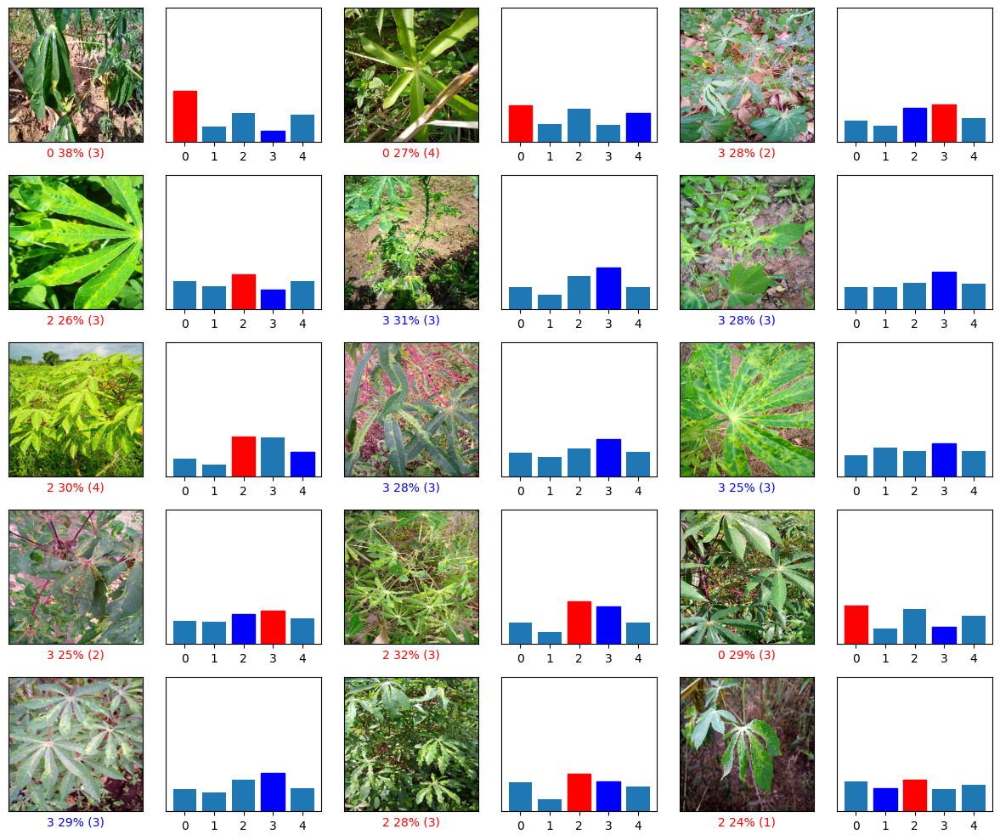

In [175]:
class_indices = train_generator.class_indices
class_names = {v: k for k, v in class_indices.items()}

NUM_CLASSES = len(class_names)

images, labels_batch = next(test_generator)
true_labels_batch = np.argmax(labels_batch, axis=1)

batch_pred_probs = model_finetuned.predict(images)

num_rows = 5
num_cols = 3
num_images = num_rows * num_cols

plt.figure(figsize=(2 * 2 * num_cols, 2 * num_rows))

for i in range(num_images):

    plt.subplot(num_rows, 2 * num_cols, 2 * i + 1)
    plot_image(i, batch_pred_probs[i], true_labels_batch, images)

    plt.subplot(num_rows, 2 * num_cols, 2 * i + 2)
    plot_value_array(i, batch_pred_probs[i], true_labels_batch)

plt.tight_layout()
plt.show()

In [176]:
test_generator.reset()

y_pred_probs = model_finetuned.predict(test_generator, verbose=1)
y_true = np.asarray(test_generator.classes)

class_indices = test_generator.class_indices
class_names = [class_name for class_name, class_id in sorted(class_indices.items(), key=lambda x: x[1])]

num_classes = y_pred_probs.shape[1]

macro_auc = roc_auc_score(y_true, y_pred_probs, multi_class="ovr", average="macro")

y_true_onehot = label_binarize(y_true, classes=np.arange(num_classes))

per_class_auc = roc_auc_score(y_true_onehot, y_pred_probs, average=None)

auc_df = pd.DataFrame({"class": class_names, "roc_auc": per_class_auc})

print(f"\nMacro ROC AUC: {macro_auc:.4f}\n")
print(auc_df)

45/45 ━━━━━━━━━━━━━━━━━━━━ 31s 675ms/step

Macro ROC AUC: 0.6891

  class   roc_auc
0     0  0.727656
1     1  0.733809
2     2  0.612433
3     3  0.709959
4     4  0.661549


In [177]:
roc_auc = {"Macro ROC AUC": macro_auc}

for class_name, auc_value in zip(class_names, per_class_auc):
    roc_auc[class_name] = auc_value

ROC_AUC.append(roc_auc)

ROC_AUC_pd = pd.DataFrame(ROC_AUC)

print(ROC_AUC_pd)

   Macro ROC AUC         0         1         2         3         4
0       0.922316  0.911712  0.938750  0.893596  0.961444  0.906079
1       0.847204  0.910270  0.840137  0.740425  0.896709  0.848480
2       0.756041  0.833646  0.815008  0.655826  0.820219  0.655506
3       0.755286  0.833953  0.814211  0.652882  0.820961  0.654425
4       0.690891  0.729812  0.735939  0.616270  0.709491  0.662941
5       0.689081  0.727656  0.733809  0.612433  0.709959  0.661549


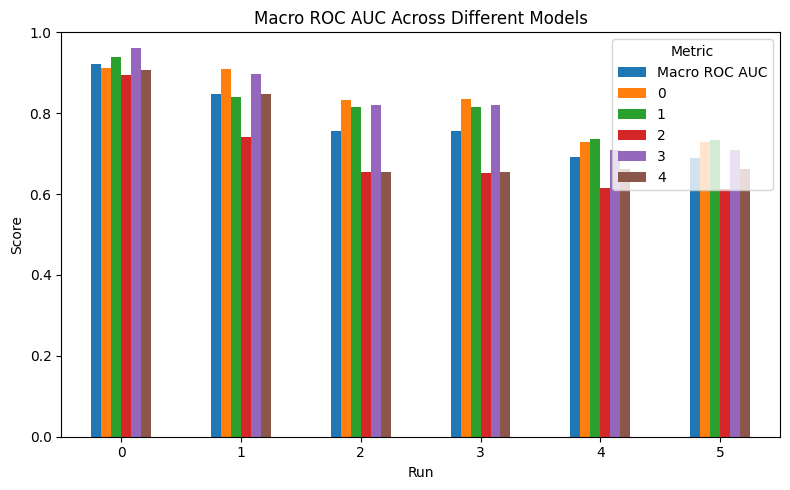

In [178]:
ROC_AUC_pd.plot(kind="bar", figsize=(8, 5))

plt.title("Macro ROC AUC Across Different Models")
plt.xlabel("Run")
plt.ylabel("Score")
plt.ylim(0, 1)
plt.xticks(rotation=0)
plt.legend(title="Metric")
plt.tight_layout()
plt.show()

# ConvNeXtBase

## 7. Pretrained ConvNeXtBase

### Training

In [179]:
base_model = keras.applications.ConvNeXtBase(include_top=False, weights="imagenet", input_shape=(IMG_SIZE, IMG_SIZE, 3), pooling="avg")

base_model.trainable = False

350926856/350926856 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


In [180]:
base_model.summary()

Model: "convnext_base"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_13      │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_base_pres… │ (None, 224, 224,  │          0 │ input_layer_13[0… │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_base_stem  │ (None, 56, 56,    │      6,528 │ convnext_base_pr… │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_base_stag… │ (None, 56, 56,    │      6,400 │ convnext_base_st… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_base_stag… │ (None, 56, 56,    │        256 │ convnext_base_st… │
│ (LayerNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_base_stag… │ (None, 56, 56,    │     66,048 │ convnext_base_st… │
│ (Dense)             │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_base_stag… │ (None, 56, 56,    │          0 │ convnext_base_st… │
│ (Activation)        │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_base_stag… │ (None, 56, 56,    │     65,664 │ convnext_base_st… │
│ (Dense)             │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_base_stag… │ (None, 56, 56,    │        128 │ convnext_base_st… │
│ (LayerScale)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_base_stag… │ (None, 56, 56,    │          0 │ convnext_base_st… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_54 (Add)        │ (None, 56, 56,    │          0 │ convnext_base_st… │
│                     │ 128)              │            │ convnext_base_st… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_base_stag… │ (None, 56, 56,    │      6,400 │ add_54[0][0]      │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_base_stag… │ (None, 56, 56,    │        256 │ convnext_base_st… │
│ (LayerNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_base_stag… │ (None, 56, 56,    │     66,048 │ convnext_base_st… │
│ (Dense)             │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_base_stag… │ (None, 56, 56,    │          0 │ convnext_base_st… │
│ (Activation)        │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_base_stag… │ (None, 56, 56,    │     65,664 │ convnext_base_st… │
│ (Dense)             │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_base_stag… │ (None, 56, 56,    │        128 │ convnext_base_st

 Total params: 87,566,464 (334.04 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 87,566,464 (334.04 MB)

In [181]:
inputs = keras.Input(shape=(IMG_SIZE, IMG_SIZE, 3))

x = base_model(inputs, training=False)

x = layers.Dropout(0.4)(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)

model_pretrained = keras.Model(inputs, outputs)

In [182]:
model_pretrained.summary()
# model_pretrained.summary(expand_nested=True) # to inspect full model

Model: "functional_82"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_18 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_base (Functional)      │ (None, 1024)           │    87,566,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 5)              │         5,125 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 87,571,589 (334.06 MB)

 Trainable params: 5,125 (20.02 KB)

 Non-trainable params: 87,566,464 (334.04 MB)

In [183]:
model_pretrained.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [184]:
mc = ModelCheckpoint('ConvNeXtBase_pretra_model.keras', monitor='val_loss', mode='min', verbose=1, save_best_only=True)

In [185]:
%%time

history_7 = model_pretrained.fit(
    train_generator,
    validation_data=val_generator,
    epochs=EPOCHS_HEAD,
    callbacks=[es, mc],
    verbose=1 ,
    class_weight=class_weight_dict
)

Epoch 1/100
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.2845 - loss: 1.9354
Epoch 1: val_loss improved from None to 1.21613, saving model to ConvNeXtBase_pretra_model.keras

Epoch 1: finished saving model to ConvNeXtBase_pretra_model.keras
134/134 ━━━━━━━━━━━━━━━━━━━━ 288s 2s/step - accuracy: 0.3531 - loss: 1.6839 - val_accuracy: 0.5453 - val_loss: 1.2161
Epoch 2/100
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.4715 - loss: 1.4209
Epoch 2: val_loss improved from 1.21613 to 1.16794, saving model to ConvNeXtBase_pretra_model.keras

Epoch 2: finished saving model to ConvNeXtBase_pretra_model.keras
134/134 ━━━━━━━━━━━━━━━━━━━━ 241s 2s/step - accuracy: 0.4926 - loss: 1.3857 - val_accuracy: 0.5643 - val_loss: 1.1679
Epoch 3/100
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.5215 - loss: 1.3418
Epoch 3: val_loss improved from 1.16794 to 1.06637, saving model to ConvNeXtBase_pretra_model.keras

Epoch 3: finished saving model to ConvNeXtBase_pretra_model.keras
134/134 

In [186]:
model_pretrained=keras.models.load_model('ConvNeXtBase_pretra_model.keras')

### Evaluating

In [187]:
model_pretrained.evaluate(test_generator)

45/45 ━━━━━━━━━━━━━━━━━━━━ 63s 1s/step - accuracy: 0.6203 - loss: 0.9830


[0.9830323457717896, 0.6203271150588989]

In [188]:
pred_probs = model_pretrained.predict(test_generator)

predictions = np.argmax(pred_probs, axis=1)

45/45 ━━━━━━━━━━━━━━━━━━━━ 62s 1s/step


In [189]:
pred_labels = np.argmax(pred_probs, axis=1)
true_labels = test_generator.classes

In [190]:
metrics = {
    "Accuracy": accuracy_score(true_labels, predictions),
    "Precision": precision_score(true_labels, predictions, average="macro"),
    "Recall": recall_score(true_labels, predictions, average="macro"),
    "F1_Score": f1_score(true_labels, predictions, average="macro")
}

ErrorMetrics.append(metrics)

ErrorMetrics_pd = pd.DataFrame(ErrorMetrics)

print(ErrorMetrics_pd)

   Accuracy  Precision    Recall  F1_Score
0  0.773364   0.633636  0.629487  0.620552
1  0.606542   0.454073  0.527672  0.465028
2  0.488785   0.362103  0.427039  0.361729
3  0.464252   0.359884  0.433910  0.360546
4  0.469159   0.324245  0.318956  0.267922
5  0.422430   0.326849  0.330483  0.266478
6  0.620327   0.443004  0.475584  0.446775


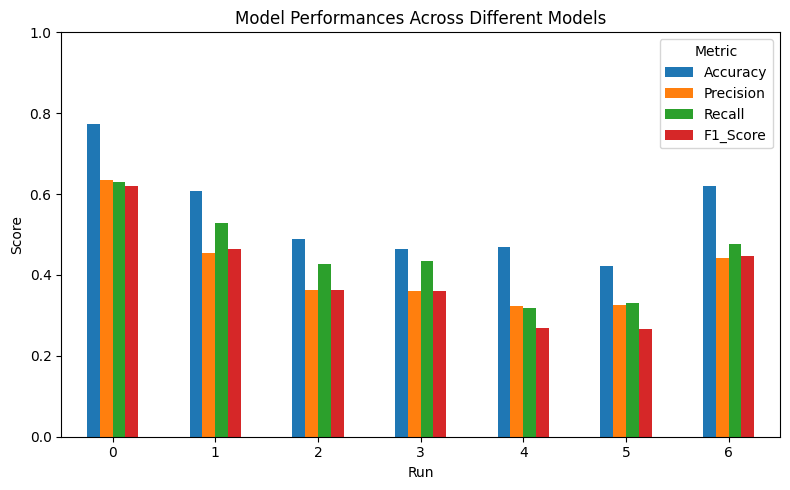

In [191]:
ErrorMetrics_pd.plot(kind="bar", figsize=(8, 5))

plt.title("Model Performances Across Different Models")
plt.xlabel("Run")
plt.ylabel("Score")
plt.ylim(0, 1)
plt.xticks(rotation=0)
plt.legend(title="Metric")
plt.tight_layout()
plt.show()

In [192]:
class_labels = list(test_generator.class_indices.keys())

print(classification_report(true_labels, pred_labels, target_names=class_labels))

              precision    recall  f1-score   support

           0       0.29      0.53      0.37       217
           1       0.49      0.41      0.45       438
           2       0.26      0.41      0.32       477
           3       0.87      0.77      0.82      2632
           4       0.31      0.25      0.28       516

    accuracy                           0.62      4280
   macro avg       0.44      0.48      0.45      4280
weighted avg       0.67      0.62      0.64      4280



In [193]:
cm = confusion_matrix(true_labels, pred_labels)
print(cm)

[[ 115   40   20   12   30]
 [  95  179   38   46   80]
 [  28   20  197  163   69]
 [  70   52  359 2033  118]
 [  94   75  140   76  131]]


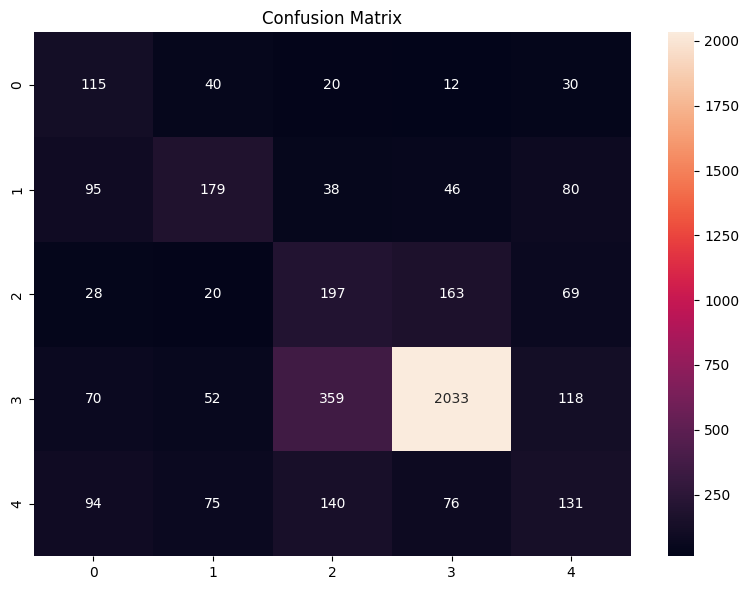

In [194]:
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=class_labels, yticklabels=class_labels, cbar=True)
plt.title("Confusion Matrix")
plt.tight_layout()
plt.show()

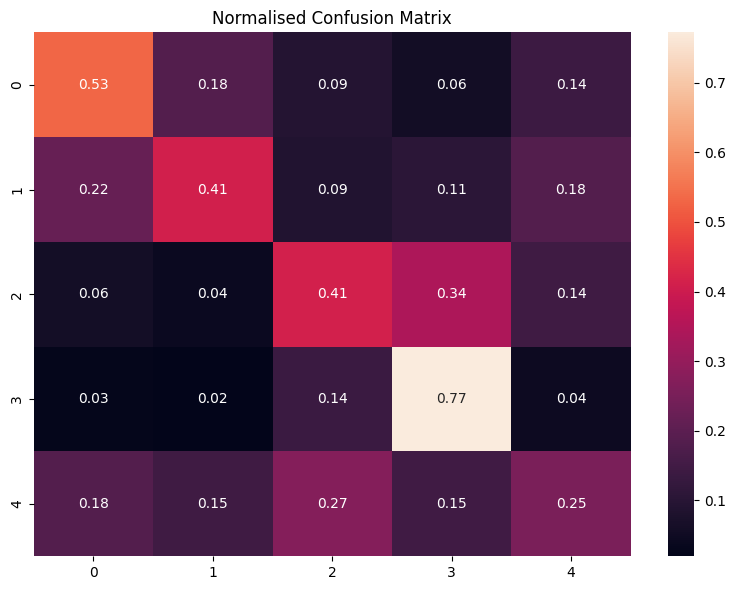

In [195]:
cm_normalised = cm.astype('float') / cm.sum(axis=1, keepdims=True)

plt.figure(figsize=(8,6))
sns.heatmap(cm_normalised, annot=True, fmt='.2f', xticklabels=class_labels, yticklabels=class_labels, cbar=True)
plt.title("Normalised Confusion Matrix")
plt.tight_layout()
plt.show()

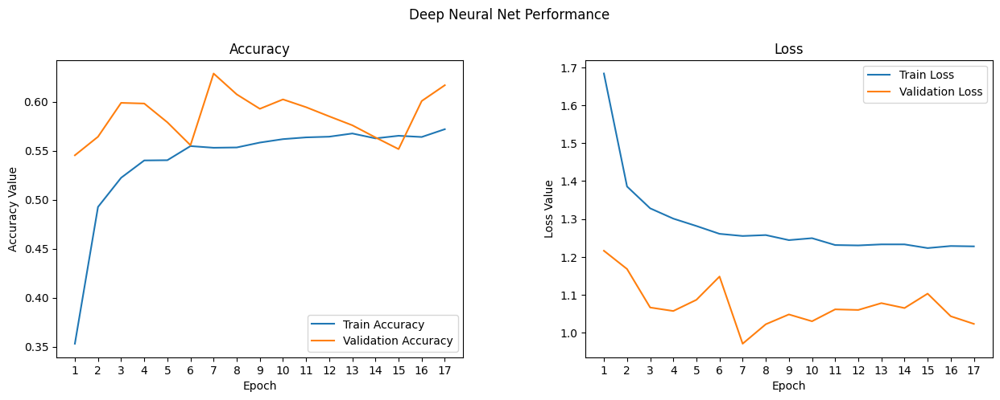

In [197]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
t = f.suptitle('Deep Neural Net Performance', fontsize=12)
f.subplots_adjust(top=0.85, wspace=0.3)

epochs = list(range(1,17+1))
ax1.plot(epochs, history_7.history['accuracy'], label='Train Accuracy')
ax1.plot(epochs, history_7.history['val_accuracy'], label='Validation Accuracy')
ax1.set_xticks(epochs)
ax1.set_ylabel('Accuracy Value')
ax1.set_xlabel('Epoch')
ax1.set_title('Accuracy')
l1 = ax1.legend(loc="best")

ax2.plot(epochs, history_7.history['loss'], label='Train Loss')
ax2.plot(epochs, history_7.history['val_loss'], label='Validation Loss')
ax2.set_xticks(epochs)
ax2.set_ylabel('Loss Value')
ax2.set_xlabel('Epoch')
ax2.set_title('Loss')
l2 = ax2.legend(loc="best")

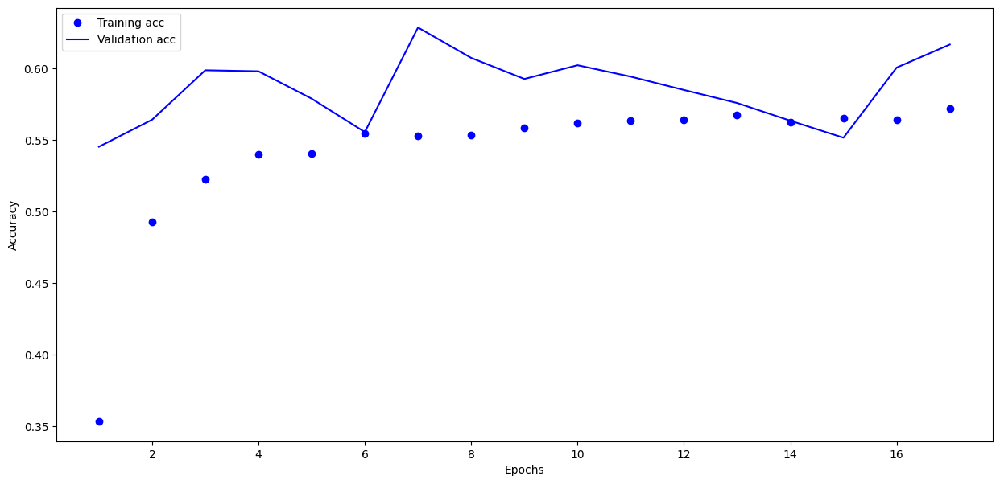

In [198]:
history_dict = history_7.history

acc_values = history_dict['accuracy']
val_acc_values = history_dict['val_accuracy']
epochs = range(1, len(acc_values) + 1)

plt.figure(num=1, figsize=(15,7))
plt.plot(epochs, acc_values, 'bo', label='Training acc')
plt.plot(epochs, val_acc_values, 'b', label='Validation acc')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.show()

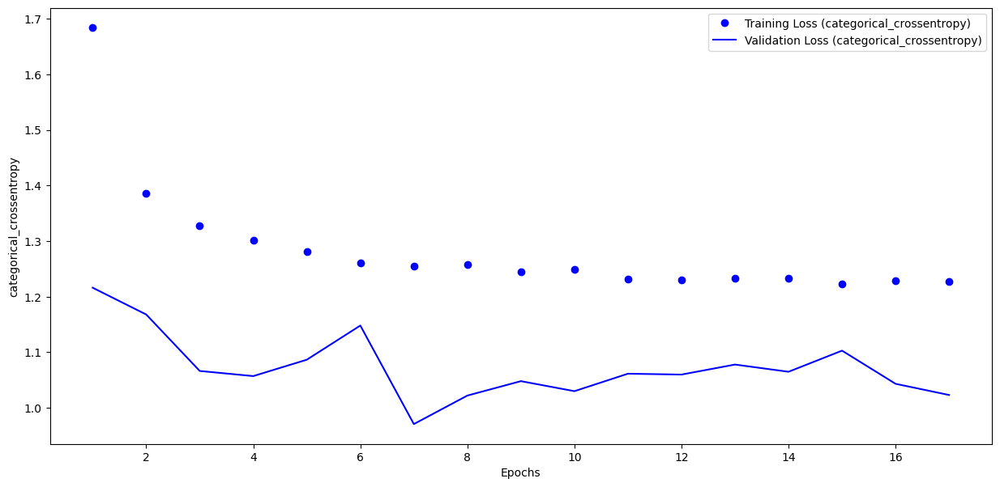

In [199]:
history_dict = history_7.history

acc_values = history_dict['loss']
val_acc_values = history_dict['val_loss']
epochs = range(1, len(acc_values) + 1)

plt.figure(num=1, figsize=(15, 7))
plt.plot(epochs, acc_values, 'bo', label='Training Loss (categorical_crossentropy)')
plt.plot(epochs, val_acc_values, 'b', label='Validation Loss (categorical_crossentropy)')
plt.xlabel('Epochs')
plt.ylabel('categorical_crossentropy')
plt.legend()

plt.show()

3/3 ━━━━━━━━━━━━━━━━━━━━ 11s 359ms/step


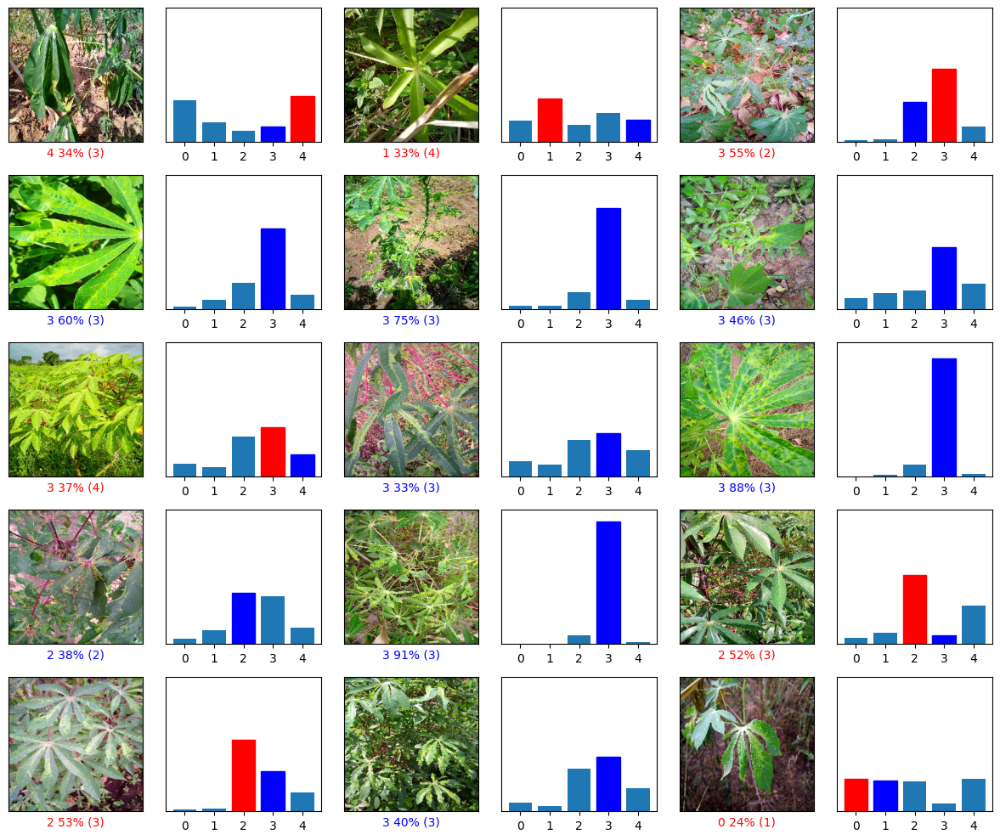

In [200]:
class_indices = train_generator.class_indices
class_names = {v: k for k, v in class_indices.items()}

NUM_CLASSES = len(class_names)

images, labels_batch = next(test_generator)
true_labels_batch = np.argmax(labels_batch, axis=1)

batch_pred_probs = model_pretrained.predict(images)

num_rows = 5
num_cols = 3
num_images = num_rows * num_cols

plt.figure(figsize=(2 * 2 * num_cols, 2 * num_rows))

for i in range(num_images):

    plt.subplot(num_rows, 2 * num_cols, 2 * i + 1)
    plot_image(i, batch_pred_probs[i], true_labels_batch, images)

    plt.subplot(num_rows, 2 * num_cols, 2 * i + 2)
    plot_value_array(i, batch_pred_probs[i], true_labels_batch)

plt.tight_layout()
plt.show()

In [201]:
test_generator.reset()

y_pred_probs = model_pretrained.predict(test_generator, verbose=1)
y_true = np.asarray(test_generator.classes)

class_indices = test_generator.class_indices
class_names = [class_name for class_name, class_id in sorted(class_indices.items(), key=lambda x: x[1])]

num_classes = y_pred_probs.shape[1]

macro_auc = roc_auc_score(y_true, y_pred_probs, multi_class="ovr", average="macro")

y_true_onehot = label_binarize(y_true, classes=np.arange(num_classes))

per_class_auc = roc_auc_score(y_true_onehot, y_pred_probs, average=None)

auc_df = pd.DataFrame({"class": class_names, "roc_auc": per_class_auc})

print(f"\nMacro ROC AUC: {macro_auc:.4f}\n")
print(auc_df)

45/45 ━━━━━━━━━━━━━━━━━━━━ 50s 1s/step

Macro ROC AUC: 0.8374

  class   roc_auc
0     0  0.877479
1     1  0.875631
2     2  0.742756
3     3  0.888686
4     4  0.802553


In [202]:
roc_auc = {"Macro ROC AUC": macro_auc}

for class_name, auc_value in zip(class_names, per_class_auc):
    roc_auc[class_name] = auc_value

ROC_AUC.append(roc_auc)

ROC_AUC_pd = pd.DataFrame(ROC_AUC)

print(ROC_AUC_pd)

   Macro ROC AUC         0         1         2         3         4
0       0.922316  0.911712  0.938750  0.893596  0.961444  0.906079
1       0.847204  0.910270  0.840137  0.740425  0.896709  0.848480
2       0.756041  0.833646  0.815008  0.655826  0.820219  0.655506
3       0.755286  0.833953  0.814211  0.652882  0.820961  0.654425
4       0.690891  0.729812  0.735939  0.616270  0.709491  0.662941
5       0.689081  0.727656  0.733809  0.612433  0.709959  0.661549
6       0.837421  0.877479  0.875631  0.742756  0.888686  0.802553


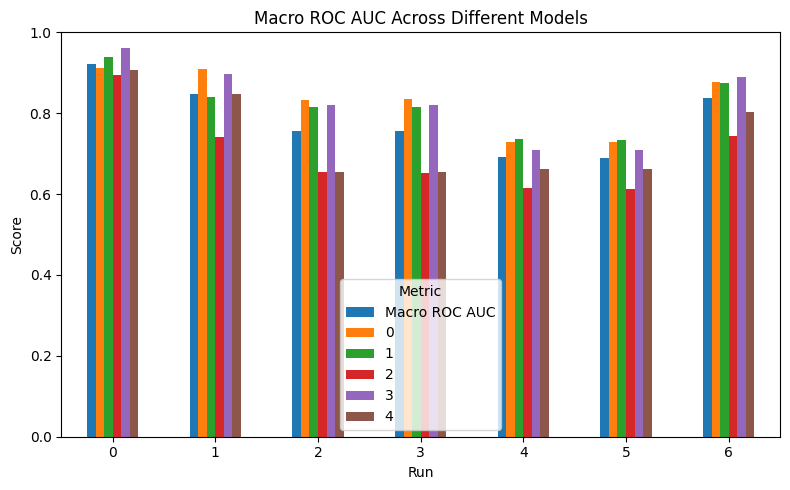

In [205]:
ROC_AUC_pd.plot(kind="bar", figsize=(8, 5))

plt.title("Macro ROC AUC Across Different Models")
plt.xlabel("Run")
plt.ylabel("Score")
plt.ylim(0, 1)
plt.xticks(rotation=0)
plt.legend(title="Metric")
plt.tight_layout()
plt.show()

## 8. Fine Tuning ConvNeXtBase

### Training

In [206]:
# Unfreeze the base model
base_model.trainable = True

# Only fine-tune the last 20 layers, rest stayes frozen
for layer in base_model.layers[:-20]:
    layer.trainable = False

In [207]:
model_pretrained.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-5),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

In [208]:
mc = ModelCheckpoint('ConvNeXtBase_finetun_model.keras', monitor='val_loss', mode='min', verbose=1, save_best_only=True)

In [209]:
%%time

history_8 = model_pretrained.fit(
    train_generator,
    validation_data=val_generator,
    epochs=EPOCHS_FINE,
    callbacks=[es, mc],
    verbose=1,
    class_weight=class_weight_dict
)

Epoch 1/100
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6015 - loss: 1.2885
Epoch 1: val_loss improved from None to 1.01550, saving model to ConvNeXtBase_finetun_model.keras

Epoch 1: finished saving model to ConvNeXtBase_finetun_model.keras
134/134 ━━━━━━━━━━━━━━━━━━━━ 281s 2s/step - accuracy: 0.5983 - loss: 1.2505 - val_accuracy: 0.6072 - val_loss: 1.0155
Epoch 2/100
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.5791 - loss: 1.2665
Epoch 2: val_loss did not improve from 1.01550
134/134 ━━━━━━━━━━━━━━━━━━━━ 233s 2s/step - accuracy: 0.5802 - loss: 1.2493 - val_accuracy: 0.6002 - val_loss: 1.0408
Epoch 3/100
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.5715 - loss: 1.2241
Epoch 3: val_loss did not improve from 1.01550
134/134 ━━━━━━━━━━━━━━━━━━━━ 244s 2s/step - accuracy: 0.5729 - loss: 1.2386 - val_accuracy: 0.5921 - val_loss: 1.0534
Epoch 4/100
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.5594 - loss: 1.2712
Epoch 4: val_loss did not improve from 1.0

In [210]:
model_finetuned = keras.models.load_model('ConvNeXtBase_finetun_model.keras')

### Evaluating

In [211]:
model_finetuned.evaluate(test_generator)

45/45 ━━━━━━━━━━━━━━━━━━━━ 62s 1s/step - accuracy: 0.6000 - loss: 1.0284


[1.0283803939819336, 0.6000000238418579]

In [212]:
pred_probs = model_finetuned.predict(test_generator)

predictions = np.argmax(pred_probs, axis=1)

45/45 ━━━━━━━━━━━━━━━━━━━━ 62s 1s/step


In [213]:
pred_labels = np.argmax(pred_probs, axis=1)
true_labels = test_generator.classes

In [214]:
metrics = {
    "Accuracy": accuracy_score(true_labels, predictions),
    "Precision": precision_score(true_labels, predictions, average="macro"),
    "Recall": recall_score(true_labels, predictions, average="macro"),
    "F1_Score": f1_score(true_labels, predictions, average="macro")
}

ErrorMetrics.append(metrics)

ErrorMetrics_pd = pd.DataFrame(ErrorMetrics)

print(ErrorMetrics_pd)

   Accuracy  Precision    Recall  F1_Score
0  0.773364   0.633636  0.629487  0.620552
1  0.606542   0.454073  0.527672  0.465028
2  0.488785   0.362103  0.427039  0.361729
3  0.464252   0.359884  0.433910  0.360546
4  0.469159   0.324245  0.318956  0.267922
5  0.422430   0.326849  0.330483  0.266478
6  0.620327   0.443004  0.475584  0.446775
7  0.600000   0.437278  0.483550  0.445278


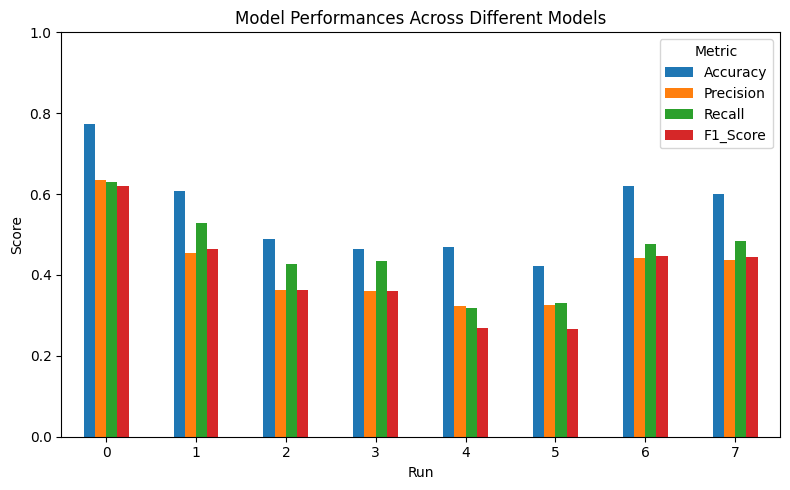

In [215]:
ErrorMetrics_pd.plot(kind="bar", figsize=(8, 5))

plt.title("Model Performances Across Different Models")
plt.xlabel("Run")
plt.ylabel("Score")
plt.ylim(0, 1)
plt.xticks(rotation=0)
plt.legend(title="Metric")
plt.tight_layout()
plt.show()

In [216]:
class_labels = list(test_generator.class_indices.keys())

print(classification_report(true_labels, pred_labels, target_names=class_labels))

              precision    recall  f1-score   support

           0       0.27      0.54      0.36       217
           1       0.46      0.43      0.45       438
           2       0.25      0.43      0.32       477
           3       0.89      0.72      0.80      2632
           4       0.31      0.29      0.30       516

    accuracy                           0.60      4280
   macro avg       0.44      0.48      0.45      4280
weighted avg       0.67      0.60      0.63      4280



In [217]:
cm = confusion_matrix(true_labels, pred_labels)
print(cm)

[[ 117   40   20    7   33]
 [  94  190   39   35   80]
 [  32   26  206  138   75]
 [  83   70  422 1906  151]
 [ 100   84  128   55  149]]


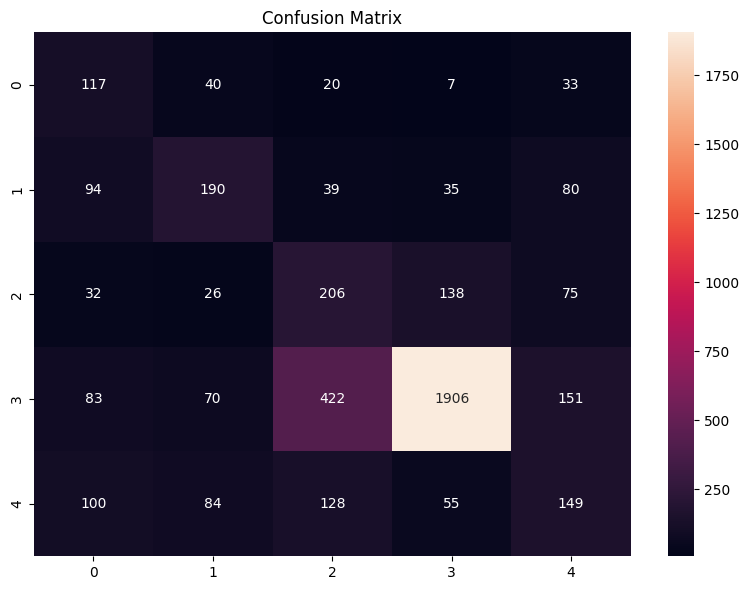

In [218]:
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=class_labels, yticklabels=class_labels, cbar=True)
plt.title("Confusion Matrix")
plt.tight_layout()
plt.show()

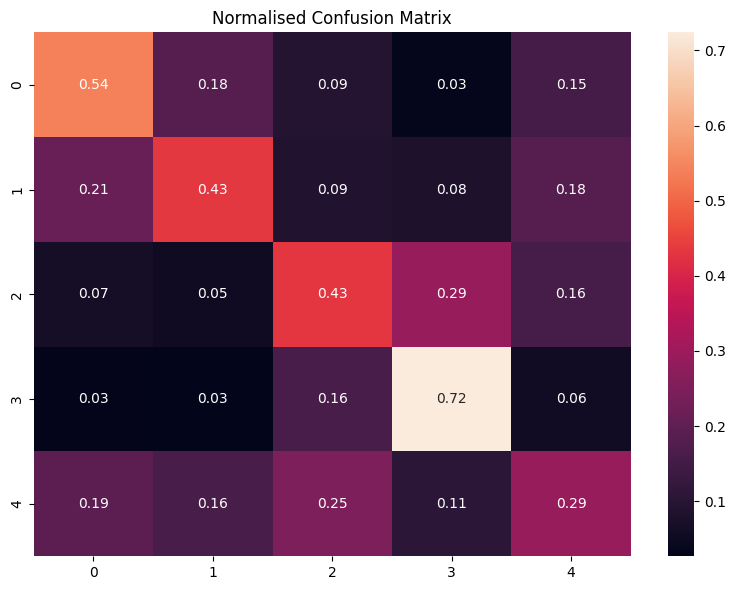

In [219]:
cm_normalised = cm.astype('float') / cm.sum(axis=1, keepdims=True)

plt.figure(figsize=(8,6))
sns.heatmap(cm_normalised, annot=True, fmt='.2f', xticklabels=class_labels, yticklabels=class_labels, cbar=True)
plt.title("Normalised Confusion Matrix")
plt.tight_layout()
plt.show()

In [ ]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
t = f.suptitle('Deep Neural Net Performance', fontsize=12)
f.subplots_adjust(top=0.85, wspace=0.3)

epochs = list(range(1,EPOCHS+1))
ax1.plot(epochs, history_8.history['accuracy'], label='Train Accuracy')
ax1.plot(epochs, history_8.history['val_accuracy'], label='Validation Accuracy')
ax1.set_xticks(epochs)
ax1.set_ylabel('Accuracy Value')
ax1.set_xlabel('Epoch')
ax1.set_title('Accuracy')
l1 = ax1.legend(loc="best")

ax2.plot(epochs, history_8.history['loss'], label='Train Loss')
ax2.plot(epochs, history_8.history['val_loss'], label='Validation Loss')
ax2.set_xticks(epochs)
ax2.set_ylabel('Loss Value')
ax2.set_xlabel('Epoch')
ax2.set_title('Loss')
l2 = ax2.legend(loc="best")

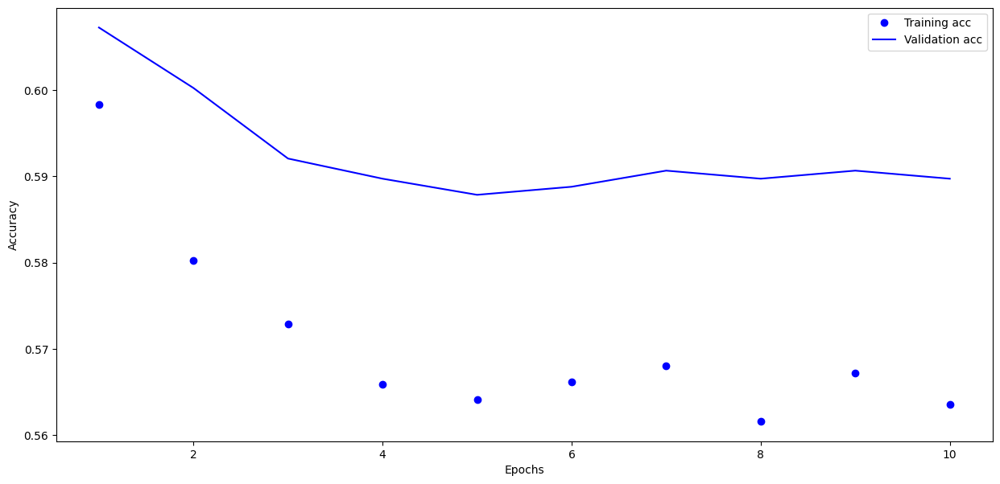

In [220]:
history_dict = history_8.history

acc_values = history_dict['accuracy']
val_acc_values = history_dict['val_accuracy']
epochs = range(1, len(acc_values) + 1)

plt.figure(num=1, figsize=(15,7))
plt.plot(epochs, acc_values, 'bo', label='Training acc')
plt.plot(epochs, val_acc_values, 'b', label='Validation acc')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.show()

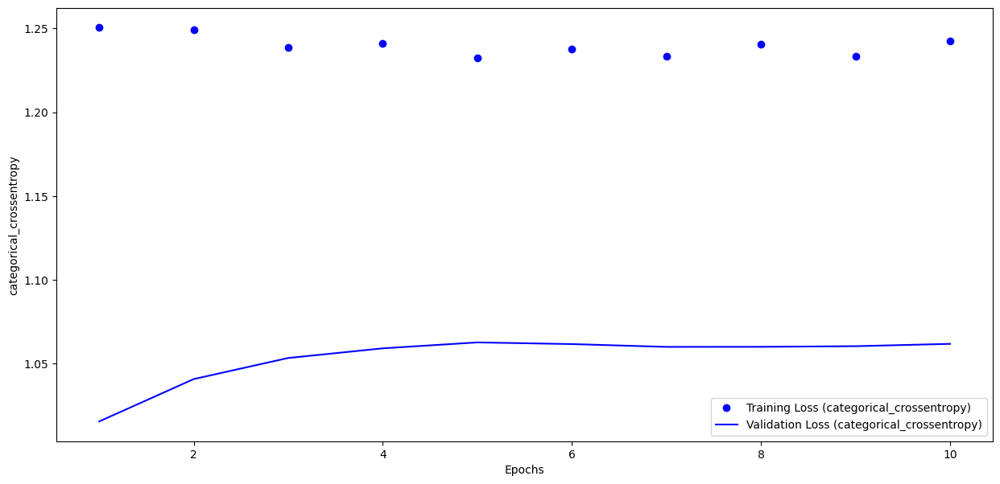

In [221]:
history_dict = history_8.history

acc_values = history_dict['loss']
val_acc_values = history_dict['val_loss']
epochs = range(1, len(acc_values) + 1)

plt.figure(num=1, figsize=(15, 7))
plt.plot(epochs, acc_values, 'bo', label='Training Loss (categorical_crossentropy)')
plt.plot(epochs, val_acc_values, 'b', label='Validation Loss (categorical_crossentropy)')
plt.xlabel('Epochs')
plt.ylabel('categorical_crossentropy')
plt.legend()

plt.show()

3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 354ms/step


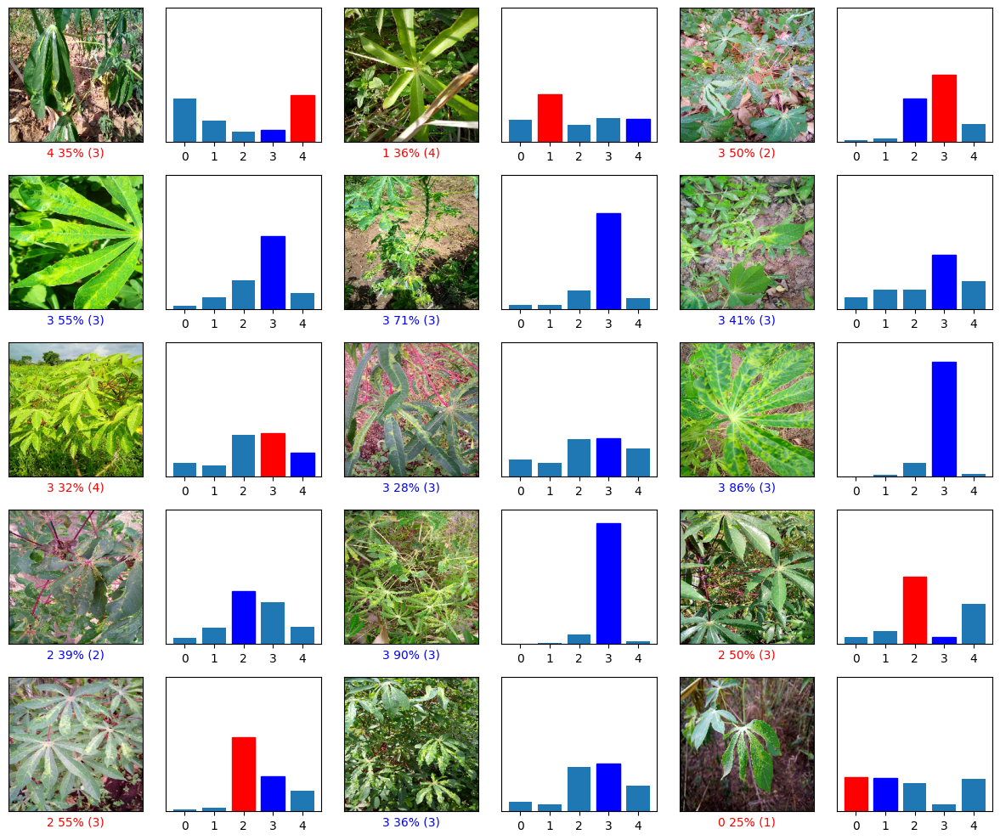

In [222]:
class_indices = train_generator.class_indices
class_names = {v: k for k, v in class_indices.items()}

NUM_CLASSES = len(class_names)

images, labels_batch = next(test_generator)
true_labels_batch = np.argmax(labels_batch, axis=1)

batch_pred_probs = model_finetuned.predict(images)

num_rows = 5
num_cols = 3
num_images = num_rows * num_cols

plt.figure(figsize=(2 * 2 * num_cols, 2 * num_rows))

for i in range(num_images):

    plt.subplot(num_rows, 2 * num_cols, 2 * i + 1)
    plot_image(i, batch_pred_probs[i], true_labels_batch, images)

    plt.subplot(num_rows, 2 * num_cols, 2 * i + 2)
    plot_value_array(i, batch_pred_probs[i], true_labels_batch)

plt.tight_layout()
plt.show()

In [223]:
test_generator.reset()

y_pred_probs = model_finetuned.predict(test_generator, verbose=1)
y_true = np.asarray(test_generator.classes)

class_indices = test_generator.class_indices
class_names = [class_name for class_name, class_id in sorted(class_indices.items(), key=lambda x: x[1])]

num_classes = y_pred_probs.shape[1]

macro_auc = roc_auc_score(y_true, y_pred_probs, multi_class="ovr", average="macro")

y_true_onehot = label_binarize(y_true, classes=np.arange(num_classes))

per_class_auc = roc_auc_score(y_true_onehot, y_pred_probs, average=None)

auc_df = pd.DataFrame({"class": class_names, "roc_auc": per_class_auc})

print(f"\nMacro ROC AUC: {macro_auc:.4f}\n")
print(auc_df)

45/45 ━━━━━━━━━━━━━━━━━━━━ 50s 1s/step

Macro ROC AUC: 0.8338

  class   roc_auc
0     0  0.874975
1     1  0.873062
2     2  0.736009
3     3  0.888597
4     4  0.796310


In [224]:
roc_auc = {"Macro ROC AUC": macro_auc}

for class_name, auc_value in zip(class_names, per_class_auc):
    roc_auc[class_name] = auc_value

ROC_AUC.append(roc_auc)

ROC_AUC_pd = pd.DataFrame(ROC_AUC)

print(ROC_AUC_pd)

   Macro ROC AUC         0         1         2         3         4
0       0.922316  0.911712  0.938750  0.893596  0.961444  0.906079
1       0.847204  0.910270  0.840137  0.740425  0.896709  0.848480
2       0.756041  0.833646  0.815008  0.655826  0.820219  0.655506
3       0.755286  0.833953  0.814211  0.652882  0.820961  0.654425
4       0.690891  0.729812  0.735939  0.616270  0.709491  0.662941
5       0.689081  0.727656  0.733809  0.612433  0.709959  0.661549
6       0.837421  0.877479  0.875631  0.742756  0.888686  0.802553
7       0.833791  0.874975  0.873062  0.736009  0.888597  0.796310


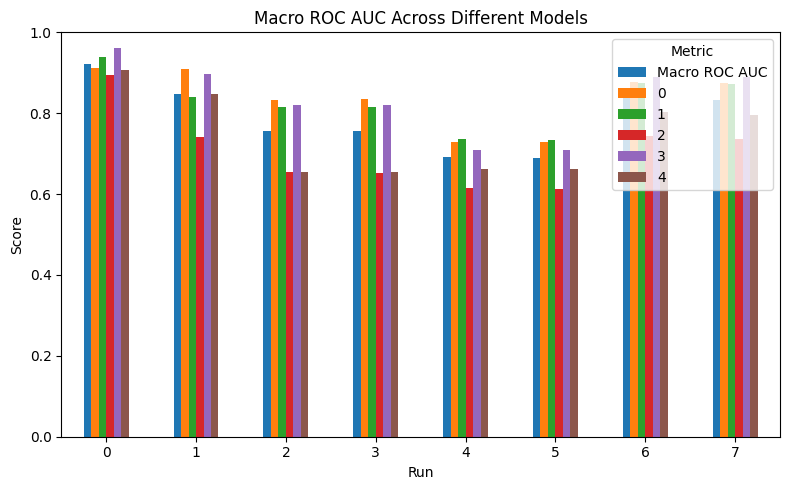

In [225]:
ROC_AUC_pd.plot(kind="bar", figsize=(8, 5))

plt.title("Macro ROC AUC Across Different Models")
plt.xlabel("Run")
plt.ylabel("Score")
plt.ylim(0, 1)
plt.xticks(rotation=0)
plt.legend(title="Metric")
plt.tight_layout()
plt.show()

# Model Comparison

In [226]:
ErrorMetrics_pd

,Accuracy,Precision,Recall,F1_Score
0,0.773364,0.633636,0.629487,0.620552
1,0.606542,0.454073,0.527672,0.465028
2,0.488785,0.362103,0.427039,0.361729
3,0.464252,0.359884,0.433910,0.360546
4,0.469159,0.324245,0.318956,0.267922
5,0.422430,0.326849,0.330483,0.266478
6,0.620327,0.443004,0.475584,0.446775
7,0.600000,0.437278,0.483550,0.445278


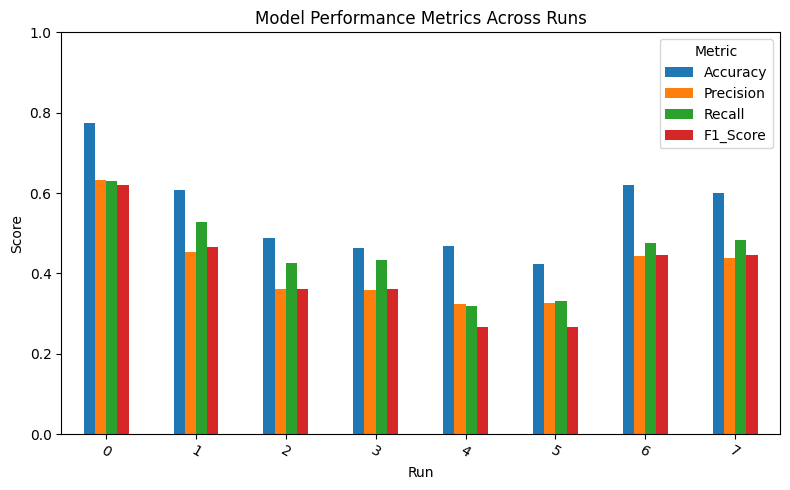

In [227]:
ErrorMetrics_pd.plot(kind="bar", figsize=(8, 5))

plt.title("Model Performance Metrics Across Runs")
plt.xlabel("Run")
plt.ylabel("Score")
plt.ylim(0, 1)
plt.xticks(rotation=-30)
plt.legend(title="Metric")
plt.tight_layout()
plt.show()

In [228]:
ROC_AUC_pd

,Macro ROC AUC,0,1,2,3,4
0,0.922316,0.911712,0.938750,0.893596,0.961444,0.906079
1,0.847204,0.910270,0.840137,0.740425,0.896709,0.848480
2,0.756041,0.833646,0.815008,0.655826,0.820219,0.655506
3,0.755286,0.833953,0.814211,0.652882,0.820961,0.654425
4,0.690891,0.729812,0.735939,0.616270,0.709491,0.662941
5,0.689081,0.727656,0.733809,0.612433,0.709959,0.661549
6,0.837421,0.877479,0.875631,0.742756,0.888686,0.802553
7,0.833791,0.874975,0.873062,0.736009,0.888597,0.796310


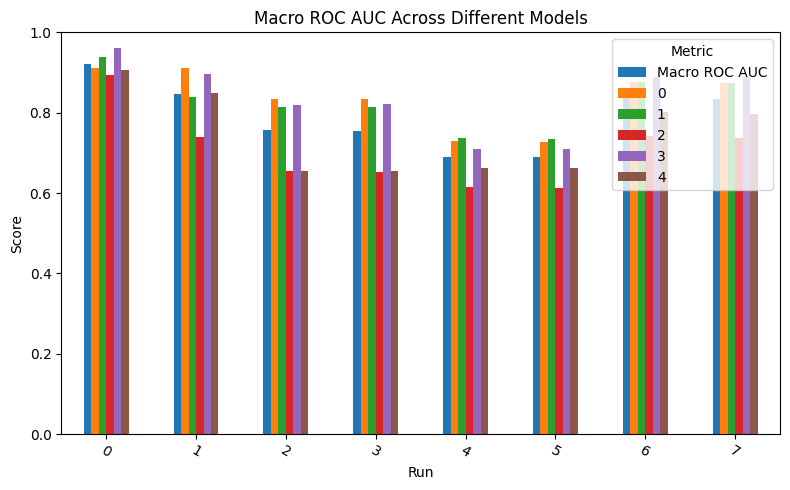

In [229]:
ROC_AUC_pd.plot(kind="bar", figsize=(8, 5))

plt.title("Macro ROC AUC Across Different Models")
plt.xlabel("Run")
plt.ylabel("Score")
plt.ylim(0, 1)
plt.xticks(rotation=-30)
plt.legend(title="Metric")
plt.tight_layout()
plt.show()

In [230]:
ErrorMetrics_pd.index = ["Base Simple Model", "Model Search Space", "Pretrained ConvNeXtTiny", "Fine Tuned ConvNeXtTiny", "Pretrained ConvNeXtSmall", "Fine Tuned ConvNeXtSmall", "Pretrained ConvNeXtBase", "Fine Tuned ConvNeXtBase"]
ErrorMetrics_pd

,Accuracy,Precision,Recall,F1_Score
Base Simple Model,0.773364,0.633636,0.629487,0.620552
Model Search Space,0.606542,0.454073,0.527672,0.465028
Pretrained ConvNeXtTiny,0.488785,0.362103,0.427039,0.361729
Fine Tuned ConvNeXtTiny,0.464252,0.359884,0.433910,0.360546
Pretrained ConvNeXtSmall,0.469159,0.324245,0.318956,0.267922
Fine Tuned ConvNeXtSmall,0.422430,0.326849,0.330483,0.266478
Pretrained ConvNeXtBase,0.620327,0.443004,0.475584,0.446775
Fine Tuned ConvNeXtBase,0.600000,0.437278,0.483550,0.445278


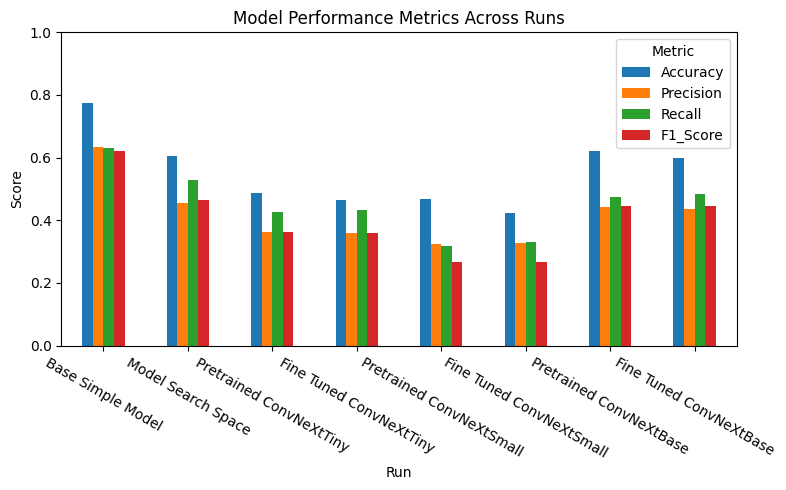

In [231]:
ErrorMetrics_pd.plot(kind="bar", figsize=(8, 5))

plt.title("Model Performance Metrics Across Runs")
plt.xlabel("Run")
plt.ylabel("Score")
plt.ylim(0, 1)
plt.xticks(rotation=-30)
plt.legend(title="Metric")
plt.tight_layout()
plt.show()

In [232]:
ROC_AUC_pd.index = ["Base Simple Model", "Model Search Space", "Pretrained ConvNeXtTiny", "Fine Tuned ConvNeXtTiny", "Pretrained ConvNeXtSmall", "Fine Tuned ConvNeXtSmall", "Pretrained ConvNeXtBase", "Fine Tuned ConvNeXtBase"]
ROC_AUC_pd

,Macro ROC AUC,0,1,2,3,4
Base Simple Model,0.922316,0.911712,0.938750,0.893596,0.961444,0.906079
Model Search Space,0.847204,0.910270,0.840137,0.740425,0.896709,0.848480
Pretrained ConvNeXtTiny,0.756041,0.833646,0.815008,0.655826,0.820219,0.655506
Fine Tuned ConvNeXtTiny,0.755286,0.833953,0.814211,0.652882,0.820961,0.654425
Pretrained ConvNeXtSmall,0.690891,0.729812,0.735939,0.616270,0.709491,0.662941
Fine Tuned ConvNeXtSmall,0.689081,0.727656,0.733809,0.612433,0.709959,0.661549
Pretrained ConvNeXtBase,0.837421,0.877479,0.875631,0.742756,0.888686,0.802553
Fine Tuned ConvNeXtBase,0.833791,0.874975,0.873062,0.736009,0.888597,0.796310


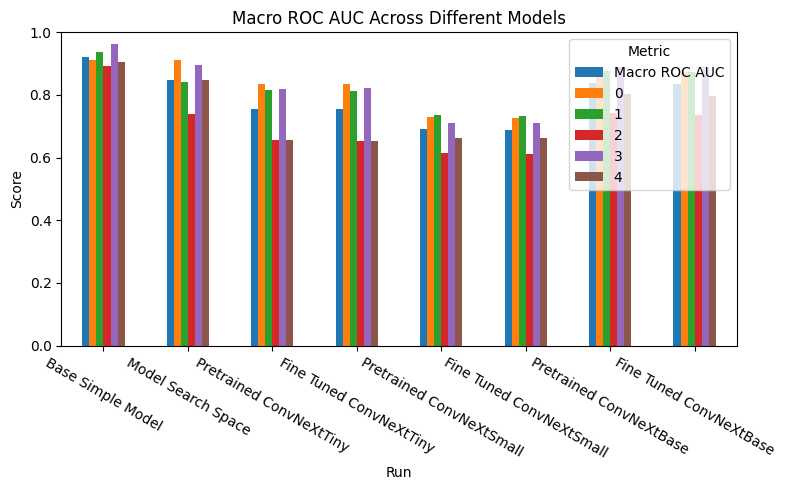

In [233]:
ROC_AUC_pd.plot(kind="bar", figsize=(8, 5))

plt.title("Macro ROC AUC Across Different Models")
plt.xlabel("Run")
plt.ylabel("Score")
plt.ylim(0, 1)
plt.xticks(rotation=-30)
plt.legend(title="Metric")
plt.tight_layout()
plt.show()